<a href="https://colab.research.google.com/github/prady-saligram/PyTradeBot/blob/main/PyTradeBot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install yfinance statsmodels scipy matplotlib tqdm --quiet

import os
import time
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import pickle
import multiprocessing as mp
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline


In [ ]:
# Load S&P 500 tickers
sp500_tickers_table = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
sp500_tickers = sp500_tickers_table[0]['Symbol'].tolist()

COINTEGRATION_FILE = "cointegration_pvalues.pickle"
DATA_POOL_FILE = "data_pool.h5"
START_DATE = "2015-01-01"
END_DATE = "2023-12-31"

if not os.path.exists(DATA_POOL_FILE):
    collected_count = 0
    with pd.HDFStore(DATA_POOL_FILE) as store:
        for symbol in sp500_tickers:
            try:
                stock_data = yf.download(symbol, start=START_DATE, end=END_DATE)
                if stock_data.empty or stock_data.isnull().any().any():
                    continue
                store.put(symbol, stock_data)
                collected_count += 1
                print(f"Collected data for {symbol} ({collected_count}/{len(sp500_tickers)})")
                time.sleep(0.1)  # Sleep to prevent rate limiting
            except Exception as e:
                print(f"Failed to collect data for {symbol}: {e}")
else:
    print("Data file already exists.")


Data file already exists.


In [ ]:
# Load data from HDF5 file
data_dict = {}
with pd.HDFStore(DATA_POOL_FILE) as store:
    symbols_in_store = [key.strip('/') for key in store.keys()]
    print("Loading data from HDF5 file...")
    for symbol in tqdm(symbols_in_store):
        df = store.get(symbol)
        if not df.isnull().any().any() and not df.empty:
            data_dict[symbol] = df

print(f"Total valid symbols: {len(data_dict)}")


Loading data from HDF5 file...


100%|██████████| 498/498 [00:07<00:00, 65.43it/s]

Total valid symbols: 498


In [ ]:
# Create DataFrame of close prices
close_prices_df = pd.DataFrame({symbol: df['Close'] for symbol, df in data_dict.items()})

# Calculate daily returns
daily_returns = close_prices_df.pct_change().dropna()


In [ ]:
# Compute correlation matrix
correlation_matrix = daily_returns.corr().abs()

# Set correlation threshold
correlation_threshold = 0.8

# Get pairs with correlation above the threshold
print("Selecting highly correlated pairs...")
highly_correlated_pairs = []
symbols_list = correlation_matrix.index.tolist()
upper_triangle_indices = np.triu_indices_from(correlation_matrix, k=1)

for i, j in tqdm(zip(*upper_triangle_indices), total=len(upper_triangle_indices[0])):
    correlation_value = correlation_matrix.iat[i, j]
    if correlation_value > correlation_threshold:
        stock1 = symbols_list[i]
        stock2 = symbols_list[j]
        highly_correlated_pairs.append((stock1, stock2))

print(f"Number of highly correlated pairs: {len(highly_correlated_pairs)}")


Selecting highly correlated pairs...


100%|██████████| 123753/123753 [00:04<00:00, 27791.20it/s]

Number of highly correlated pairs: 308


In [ ]:
def cointegration_test(pair):
    stock1, stock2 = pair
    stock1_close = np.log(close_prices_df[stock1].dropna())
    stock2_close = np.log(close_prices_df[stock2].dropna())
    min_length = min(len(stock1_close), len(stock2_close))
    stock1_close = stock1_close[-min_length:]
    stock2_close = stock2_close[-min_length:]
    if len(stock1_close) < 252:  # Ensure at least one year of data
        return None
    from statsmodels.tsa.stattools import coint
    cointegration_result = coint(stock1_close, stock2_close)
    p_value = cointegration_result[1]
    return (pair, p_value)

if not os.path.exists(COINTEGRATION_FILE):
    # Use highly_correlated_pairs from previous step
    print(f"Performing cointegration tests on {len(highly_correlated_pairs)} pairs...")
    pool = mp.Pool(processes=mp.cpu_count())
    results_list = []
    pbar = tqdm(total=len(highly_correlated_pairs))

    def collect_result(result):
        if result is not None:
            results_list.append(result)
        pbar.update()

    for pair in highly_correlated_pairs:
        pool.apply_async(cointegration_test, args=(pair,), callback=collect_result)

    pool.close()
    pool.join()
    pbar.close()

    # Collect results
    p_values = {pair: p_value for pair, p_value in results_list}

    # Save p-values
    with open(COINTEGRATION_FILE, 'wb') as f:
        pickle.dump(p_values, f)
else:
    # Load p-values
    with open(COINTEGRATION_FILE, 'rb') as f:
        p_values = pickle.load(f)


In [ ]:
# Sort and display top 20 cointegrated pairs
sorted_p_values = sorted(p_values.items(), key=lambda x: x[1])
top_cointegrated_pairs = sorted_p_values[:20]
print("\nTop 20 cointegrated pairs:")
for pair, p_value in top_cointegrated_pairs:
    print(f"{pair}: {p_value}")



Top 20 cointegrated pairs:
('HD', 'PLD'): 0.0006575498768131858
('WEC', 'XEL'): 0.0008626347171844176
('FITB', 'PNC'): 0.0009806837703715669
('MA', 'V'): 0.0016684775798327422
('EOG', 'FANG'): 0.002393553881424129
('CFG', 'NTRS'): 0.002843849964818156
('BEN', 'IVZ'): 0.0029994400701531484
('GOOG', 'GOOGL'): 0.0046177107508387875
('KO', 'PEP'): 0.004757911749672714
('BLDR', 'LEN'): 0.004879996669685841
('HBAN', 'NTRS'): 0.006004246570386905
('DUK', 'LNT'): 0.007065798145418979
('A', 'MTD'): 0.008134502487757305
('ACGL', 'EG'): 0.00814405979522163
('CTRA', 'MRO'): 0.010103566493157396
('CDNS', 'SNPS'): 0.012451078653359125
('CFG', 'HBAN'): 0.01300295808544845
('CMS', 'LNT'): 0.014198827125798537
('IR', 'PH'): 0.014679057727686455
('DUK', 'SRE'): 0.015550425938315555


In [ ]:
# Function to implement Bollinger Bands Strategy
def bollinger_bands_strategy(pair_data, stock1, stock2):
    # Calculate the spread
    spread = pair_data[stock2] - pair_data[stock1]

    # Calculate Bollinger Bands
    window_size = 20
    spread_mean = spread.rolling(window_size).mean()
    spread_std = spread.rolling(window_size).std()
    upper_band = spread_mean + 2 * spread_std
    lower_band = spread_mean - 2 * spread_std

    # Generate signals
    signals = pd.DataFrame(index=spread.index)
    signals['Position'] = 0

    # Generate buy signals
    signals['Position'][window_size:] = np.where(spread[window_size:] < lower_band[window_size:], 1, 0)

    # Generate sell signals
    signals['Position'][window_size:] = np.where(spread[window_size:] > upper_band[window_size:], -1, signals['Position'][window_size:])

    # Forward fill positions
    signals['Position'] = signals['Position'].replace(to_replace=0, method='ffill')

    return signals, spread

# Function to implement Moving Average Crossover Strategy
def moving_average_crossover_strategy(pair_data, stock1, stock2):
    # Calculate the spread
    spread = pair_data[stock2] - pair_data[stock1]

    # Calculate moving averages
    short_window = 10
    long_window = 30
    spread_short_ma = spread.rolling(window=short_window).mean()
    spread_long_ma = spread.rolling(window=long_window).mean()

    # Generate signals
    signals = pd.DataFrame(index=spread.index)
    signals['Position'] = 0

    # Signal generation
    signals['Position'][long_window:] = np.where(spread_short_ma[long_window:] > spread_long_ma[long_window:], 1, -1)

    return signals, spread


In [ ]:
def backtest_strategy(pair_data, stock1, stock2, signals, spread, strategy_name):
    # Calculate position changes to identify trades
    signals['Signal'] = signals['Position'].diff()
    position_changes = signals['Signal'].abs()

    # Calculate daily returns of the pair
    pair_returns = pair_data[[stock1, stock2]].pct_change().dropna()

    # Calculate the spread returns
    spread_returns = (pair_returns[stock2] - pair_returns[stock1])

    # Calculate strategy returns
    strategy_returns = signals['Position'].shift(1) * spread_returns

    # Include transaction costs
    transaction_cost = 0.001  # 0.1%
    trading_costs = position_changes * transaction_cost
    strategy_returns_after_costs = strategy_returns - trading_costs

    # Calculate cumulative returns
    cumulative_returns = (1 + strategy_returns_after_costs).cumprod()
    total_return = (cumulative_returns.iloc[-1] - 1) * 100

    # Calculate performance metrics
    mean_return = strategy_returns_after_costs.mean()
    std_return = strategy_returns_after_costs.std()
    sharpe_ratio = (mean_return / std_return) * np.sqrt(252) if std_return != 0 else np.nan

    # Sortino Ratio
    negative_returns = strategy_returns_after_costs[strategy_returns_after_costs < 0]
    downside_std = negative_returns.std()
    sortino_ratio = (mean_return / downside_std) * np.sqrt(252) if downside_std != 0 else np.nan

    # Number of trades executed
    num_trades = position_changes.sum() / 2  # Each trade consists of an entry and an exit

    # Record trade details
    trade_details = []
    current_trade = None
    signals_index = signals.index

    for i in range(1, len(signals)):
        date = signals_index[i]
        position = signals['Position'].iloc[i]
        previous_position = signals['Position'].iloc[i - 1]

        # Check for trade entry/exit
        if position != previous_position:
            if current_trade is None:
                # Start a new trade
                current_trade = {
                    'Pair': f"{stock1}-{stock2}",
                    'Entry Date': date,
                    'Entry Position': position,
                    'Entry Price Stock1': pair_data[stock1].iloc[i],
                    'Entry Price Stock2': pair_data[stock2].iloc[i],
                    'Entry Spread': spread.iloc[i]
                }
            else:
                # Close the existing trade
                current_trade['Exit Date'] = date
                current_trade['Exit Price Stock1'] = pair_data[stock1].iloc[i]
                current_trade['Exit Price Stock2'] = pair_data[stock2].iloc[i]
                current_trade['Exit Spread'] = spread.iloc[i]
                # Calculate profit/loss
                if current_trade['Entry Position'] == 1:
                    # Long spread: Buy stock2, sell stock1
                    profit_loss = (
                        (current_trade['Exit Price Stock2'] - current_trade['Entry Price Stock2']) -
                        (current_trade['Exit Price Stock1'] - current_trade['Entry Price Stock1'])
                    )
                elif current_trade['Entry Position'] == -1:
                    # Short spread: Sell stock2, buy stock1
                    profit_loss = (
                        (current_trade['Entry Price Stock2'] - current_trade['Exit Price Stock2']) -
                        (current_trade['Entry Price Stock1'] - current_trade['Exit Price Stock1'])
                    )
                current_trade['Profit/Loss'] = profit_loss
                trade_details.append(current_trade)
                current_trade = None  # Reset current trade

    # Close any open trade at the end
    if current_trade is not None and 'Exit Date' not in current_trade:
        current_trade['Exit Date'] = signals.index[-1]
        current_trade['Exit Price Stock1'] = pair_data[stock1].iloc[-1]
        current_trade['Exit Price Stock2'] = pair_data[stock2].iloc[-1]
        current_trade['Exit Spread'] = spread.iloc[-1]
        if current_trade['Entry Position'] == 1:
            profit_loss = (
                (current_trade['Exit Price Stock2'] - current_trade['Entry Price Stock2']) -
                (current_trade['Exit Price Stock1'] - current_trade['Entry Price Stock1'])
            )
        elif current_trade['Entry Position'] == -1:
            profit_loss = (
                (current_trade['Entry Price Stock2'] - current_trade['Exit Price Stock2']) -
                (current_trade['Entry Price Stock1'] - current_trade['Exit Price Stock1'])
            )
        current_trade['Profit/Loss'] = profit_loss
        trade_details.append(current_trade)

    # Convert trade details to a DataFrame
    trades_df = pd.DataFrame(trade_details)

    if not trades_df.empty:
        # Calculate the return of each trade
        trades_df['Trade Return (%)'] = (trades_df['Profit/Loss'] / abs(trades_df['Entry Price Stock1'] - trades_df['Entry Price Stock2'])) * 100

        # Sort trades by return
        trades_df = trades_df.sort_values(by='Trade Return (%)', ascending=False)

        # Plot the spread and signals
        plt.figure(figsize=(14, 7))
        plt.plot(spread.index, spread, label='Spread')

        if strategy_name == 'Bollinger Bands':
            # Plot Bollinger Bands
            window_size = 20
            spread_mean = spread.rolling(window_size).mean()
            spread_std = spread.rolling(window_size).std()
            upper_band = spread_mean + 2 * spread_std
            lower_band = spread_mean - 2 * spread_std
            plt.plot(spread_mean.index, spread_mean, label='Spread Mean')
            plt.plot(upper_band.index, upper_band, label='Upper Band', linestyle='--')
            plt.plot(lower_band.index, lower_band, label='Lower Band', linestyle='--')
        elif strategy_name == 'Moving Average Crossover':
            # Plot moving averages
            short_window = 10
            long_window = 30
            spread_short_ma = spread.rolling(window=short_window).mean()
            spread_long_ma = spread.rolling(window=long_window).mean()
            plt.plot(spread_short_ma.index, spread_short_ma, label=f'Short MA ({short_window})')
            plt.plot(spread_long_ma.index, spread_long_ma, label=f'Long MA ({long_window})')

        # Annotate trades
        for idx, trade in trades_df.iterrows():
            entry_date = trade['Entry Date']
            exit_date = trade['Exit Date']
            entry_spread = trade['Entry Spread']
            exit_spread = trade['Exit Spread']
            trade_return = trade['Trade Return (%)']

            # Highlight the best trades (e.g., top 5%)
            if trade_return >= trades_df['Trade Return (%)'].quantile(0.95):
                color = 'green' if trade['Entry Position'] == 1 else 'red'
                plt.scatter(entry_date, entry_spread, color=color, marker='^', s=100, label='Entry (Best Trades)')
                plt.scatter(exit_date, exit_spread, color=color, marker='v', s=100, label='Exit (Best Trades)')
            else:
                plt.scatter(entry_date, entry_spread, color='grey', marker='^', s=50, alpha=0.5)
                plt.scatter(exit_date, exit_spread, color='grey', marker='v', s=50, alpha=0.5)

        plt.title(f'{strategy_name} Strategy for {stock1}-{stock2}')
        plt.xlabel('Date')
        plt.ylabel('Spread')
        plt.legend()
        plt.show()

        # Trade statistics
        total_trades = len(trades_df)
        profitable_trades = len(trades_df[trades_df['Profit/Loss'] > 0])
        losing_trades = len(trades_df[trades_df['Profit/Loss'] <= 0])
        win_rate = profitable_trades / total_trades * 100
        average_return = trades_df['Trade Return (%)'].mean()
        average_win = trades_df[trades_df['Profit/Loss'] > 0]['Trade Return (%)'].mean()
        average_loss = trades_df[trades_df['Profit/Loss'] <= 0]['Trade Return (%)'].mean()

        print(f"\nTrade Statistics for {stock1}-{stock2} using {strategy_name}:")
        print(f"Total Trades: {total_trades}")
        print(f"Profitable Trades: {profitable_trades}")
        print(f"Losing Trades: {losing_trades}")
        print(f"Win Rate: {win_rate:.2f}%")
        print(f"Average Trade Return: {average_return:.2f}%")
        print(f"Average Winning Trade Return: {average_win:.2f}%")
        print(f"Average Losing Trade Return: {average_loss:.2f}%")
    else:
        print(f"No trades executed for {stock1}-{stock2} using {strategy_name}")
        win_rate = np.nan
        average_return = np.nan

    # Return results
    results = {
        'Pair': f"{stock1}-{stock2}",
        'Strategy': strategy_name,
        'Total Return': total_return,
        'Sharpe Ratio': sharpe_ratio,
        'Sortino Ratio': sortino_ratio,
        'Number of Trades': num_trades,
        'Win Rate (%)': win_rate,
        'Average Trade Return (%)': average_return
    }

    return results



Testing pair: HD, PLD


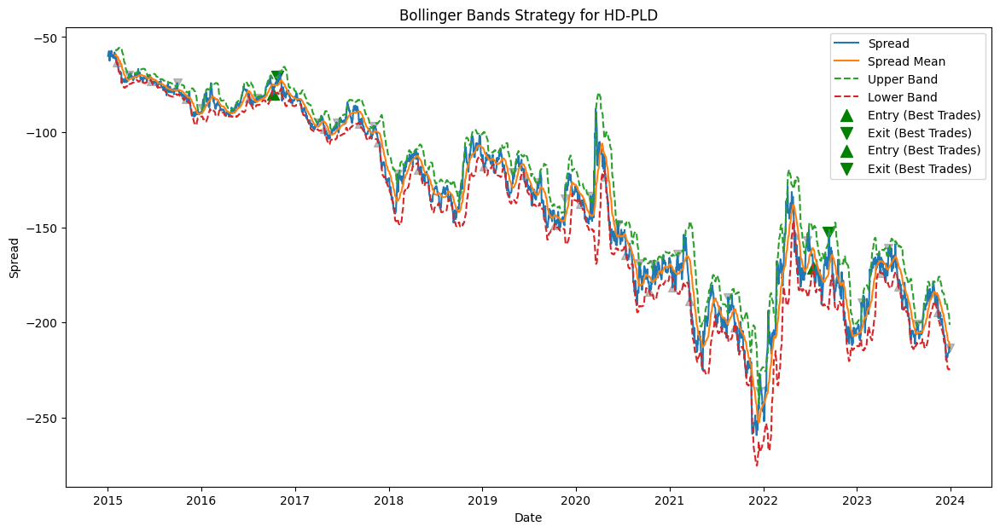


Trade Statistics for HD-PLD using Bollinger Bands:
Total Trades: 26
Profitable Trades: 10
Losing Trades: 16
Win Rate: 38.46%
Average Trade Return: -3.06%
Average Winning Trade Return: 6.43%
Average Losing Trade Return: -8.99%


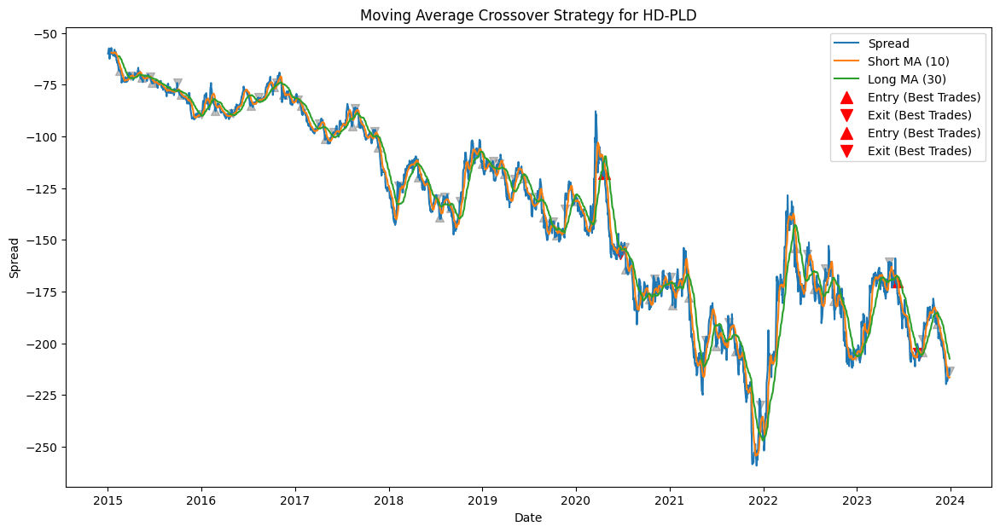


Trade Statistics for HD-PLD using Moving Average Crossover:
Total Trades: 39
Profitable Trades: 21
Losing Trades: 18
Win Rate: 53.85%
Average Trade Return: 3.10%
Average Winning Trade Return: 9.35%
Average Losing Trade Return: -4.19%

Testing pair: WEC, XEL


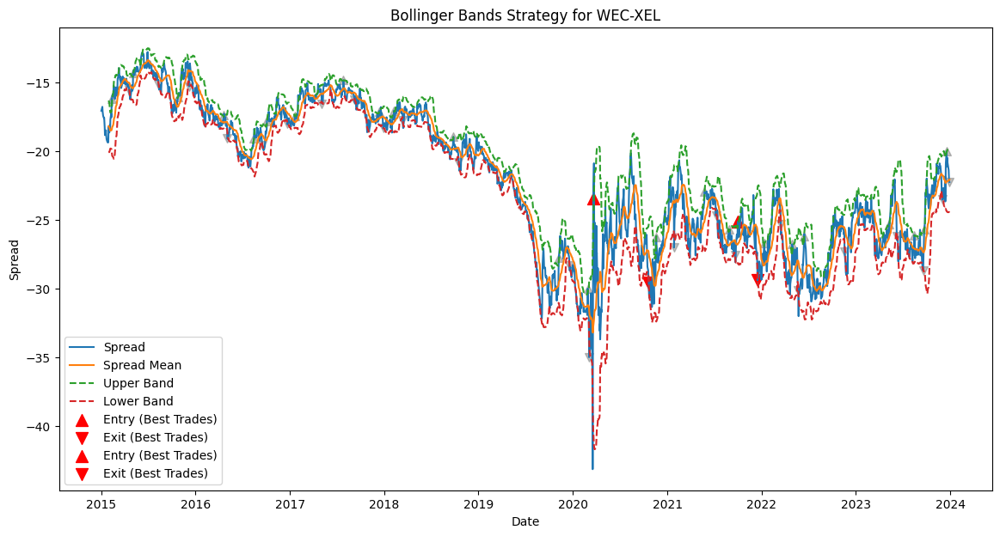


Trade Statistics for WEC-XEL using Bollinger Bands:
Total Trades: 25
Profitable Trades: 20
Losing Trades: 5
Win Rate: 80.00%
Average Trade Return: 5.73%
Average Winning Trade Return: 8.53%
Average Losing Trade Return: -5.50%


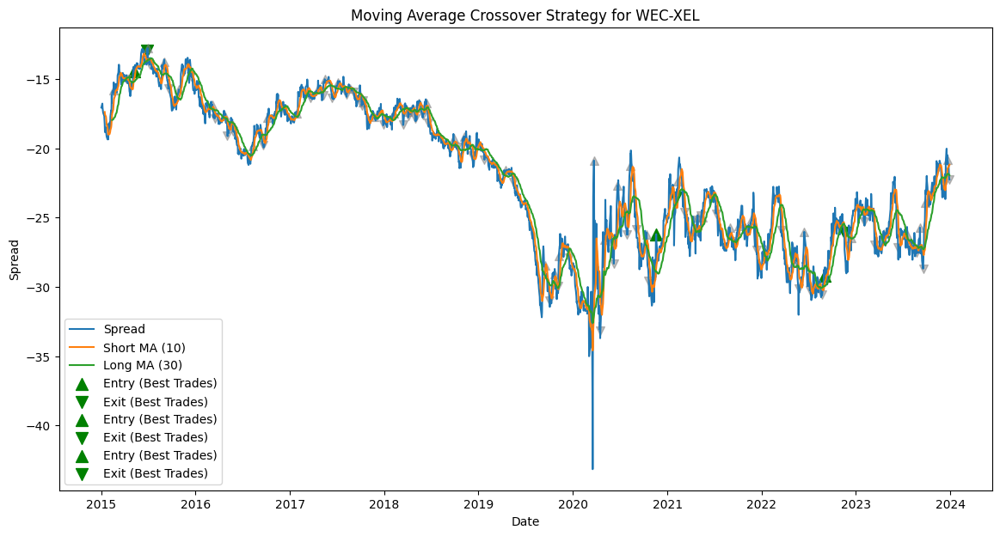


Trade Statistics for WEC-XEL using Moving Average Crossover:
Total Trades: 56
Profitable Trades: 15
Losing Trades: 41
Win Rate: 26.79%
Average Trade Return: -4.50%
Average Winning Trade Return: 4.82%
Average Losing Trade Return: -7.92%

Testing pair: FITB, PNC


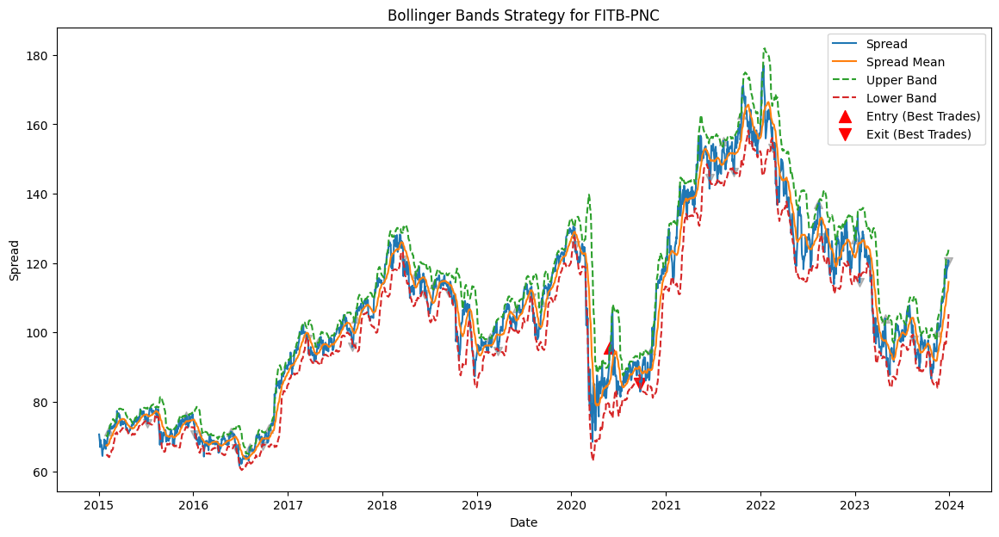


Trade Statistics for FITB-PNC using Bollinger Bands:
Total Trades: 20
Profitable Trades: 12
Losing Trades: 8
Win Rate: 60.00%
Average Trade Return: -3.65%
Average Winning Trade Return: 6.05%
Average Losing Trade Return: -18.20%


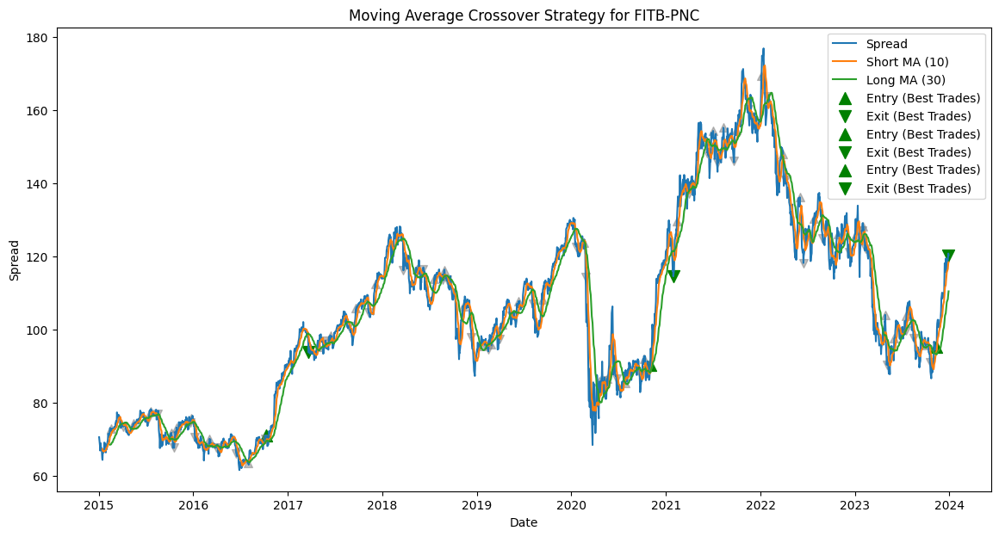


Trade Statistics for FITB-PNC using Moving Average Crossover:
Total Trades: 46
Profitable Trades: 20
Losing Trades: 26
Win Rate: 43.48%
Average Trade Return: 0.70%
Average Winning Trade Return: 7.27%
Average Losing Trade Return: -4.36%

Testing pair: MA, V


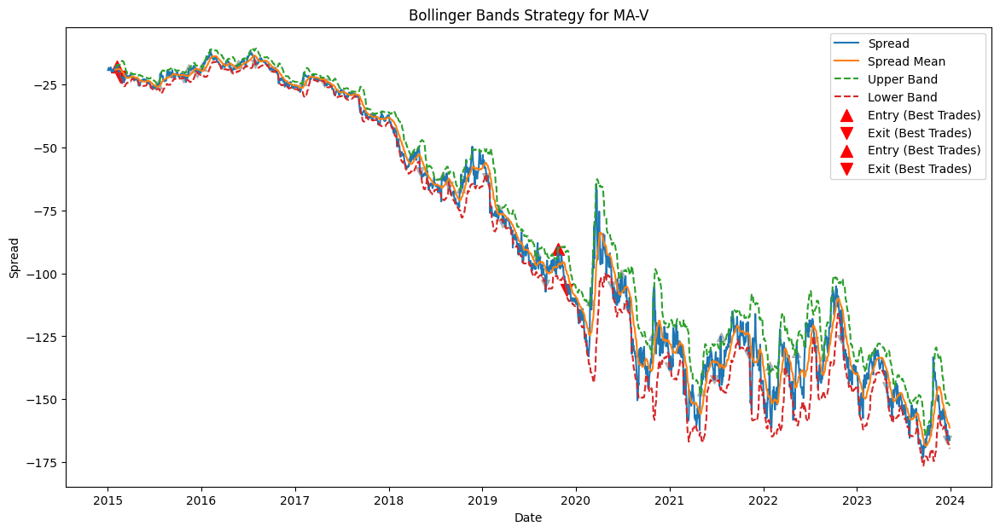


Trade Statistics for MA-V using Bollinger Bands:
Total Trades: 22
Profitable Trades: 15
Losing Trades: 7
Win Rate: 68.18%
Average Trade Return: 4.75%
Average Winning Trade Return: 9.32%
Average Losing Trade Return: -5.05%


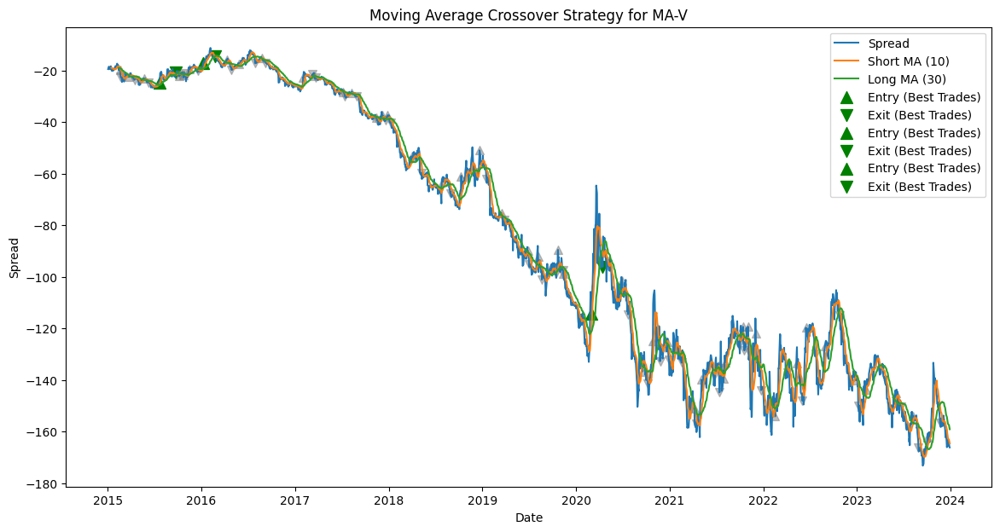


Trade Statistics for MA-V using Moving Average Crossover:
Total Trades: 51
Profitable Trades: 15
Losing Trades: 36
Win Rate: 29.41%
Average Trade Return: -3.69%
Average Winning Trade Return: 6.33%
Average Losing Trade Return: -7.87%

Testing pair: EOG, FANG


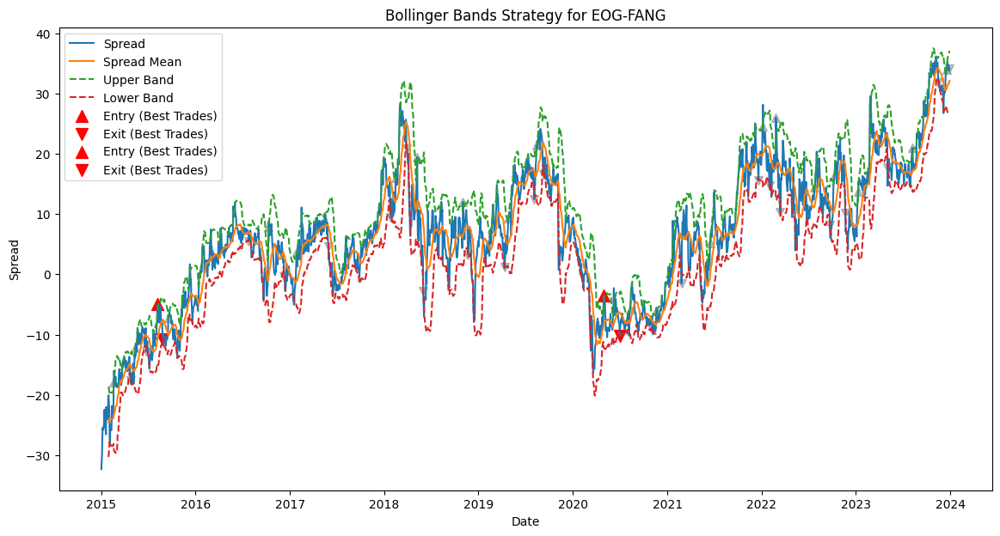


Trade Statistics for EOG-FANG using Bollinger Bands:
Total Trades: 24
Profitable Trades: 13
Losing Trades: 11
Win Rate: 54.17%
Average Trade Return: -27.55%
Average Winning Trade Return: 73.82%
Average Losing Trade Return: -147.36%


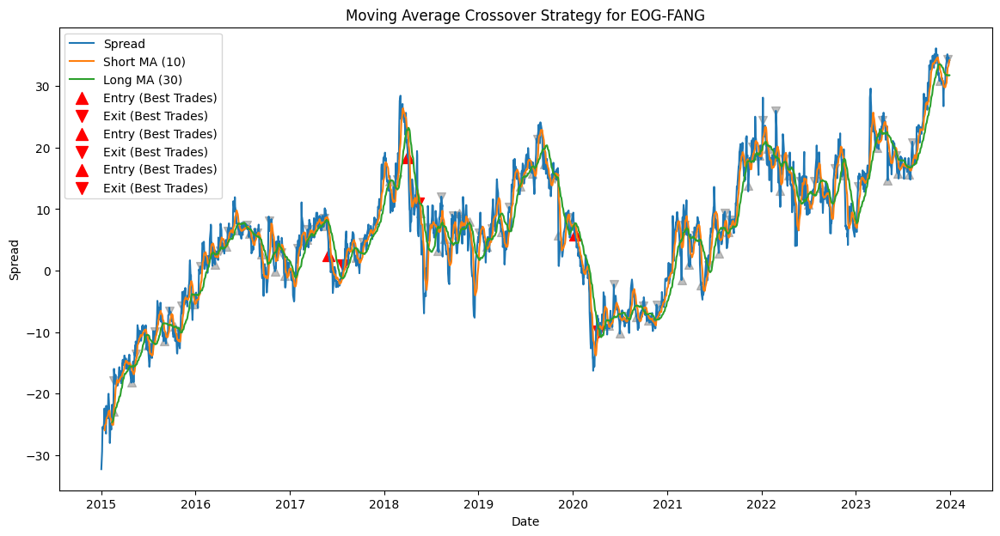


Trade Statistics for EOG-FANG using Moving Average Crossover:
Total Trades: 53
Profitable Trades: 9
Losing Trades: 44
Win Rate: 16.98%
Average Trade Return: -119.78%
Average Winning Trade Return: 51.59%
Average Losing Trade Return: -154.83%

Testing pair: CFG, NTRS


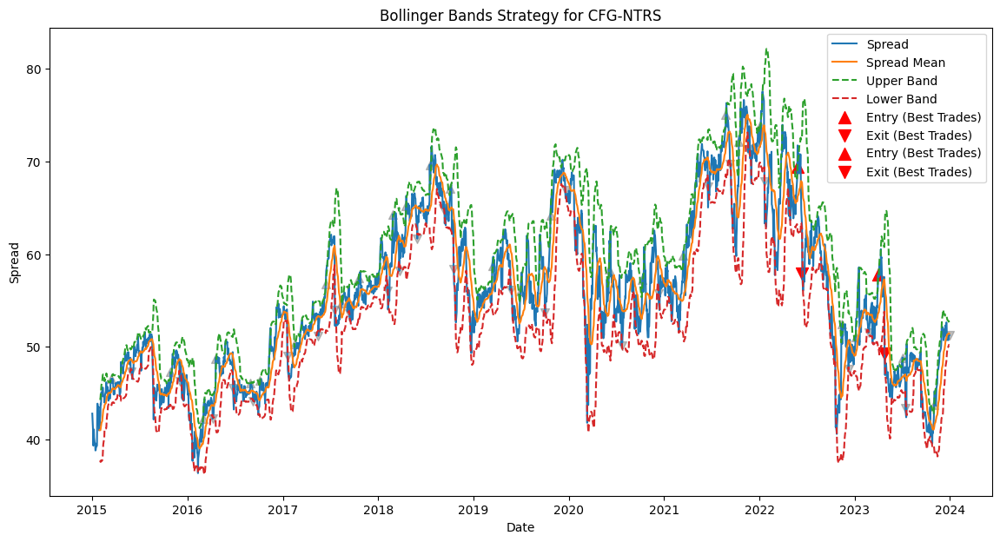


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 29
Profitable Trades: 21
Losing Trades: 8
Win Rate: 72.41%
Average Trade Return: 3.68%
Average Winning Trade Return: 7.17%
Average Losing Trade Return: -5.48%


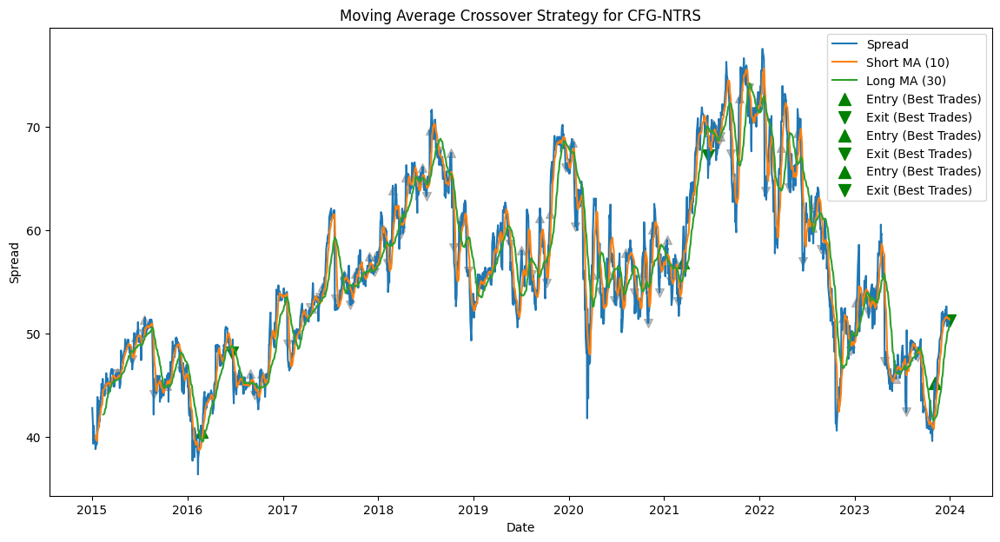


Trade Statistics for CFG-NTRS using Moving Average Crossover:
Total Trades: 49
Profitable Trades: 14
Losing Trades: 35
Win Rate: 28.57%
Average Trade Return: -2.60%
Average Winning Trade Return: 6.50%
Average Losing Trade Return: -6.23%

Testing pair: BEN, IVZ


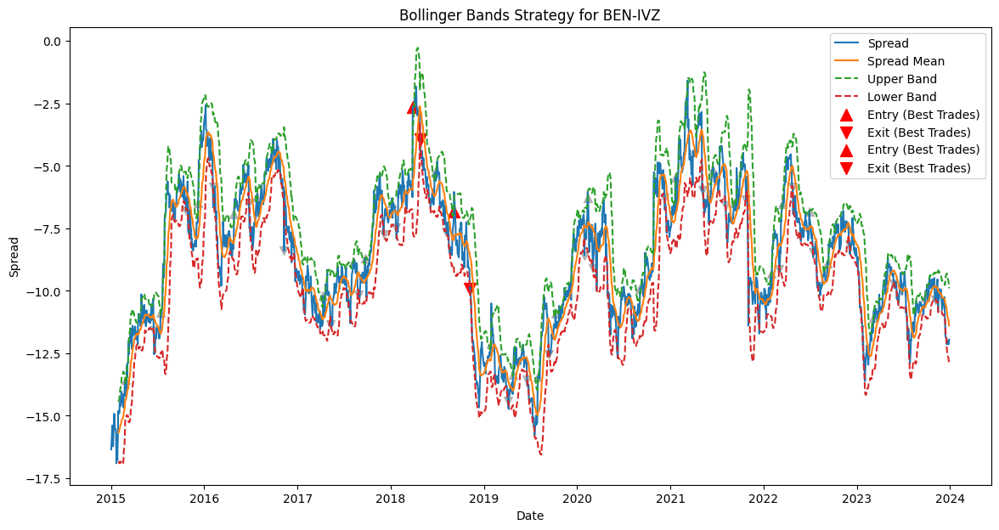


Trade Statistics for BEN-IVZ using Bollinger Bands:
Total Trades: 27
Profitable Trades: 14
Losing Trades: 13
Win Rate: 51.85%
Average Trade Return: 6.09%
Average Winning Trade Return: 24.52%
Average Losing Trade Return: -13.75%


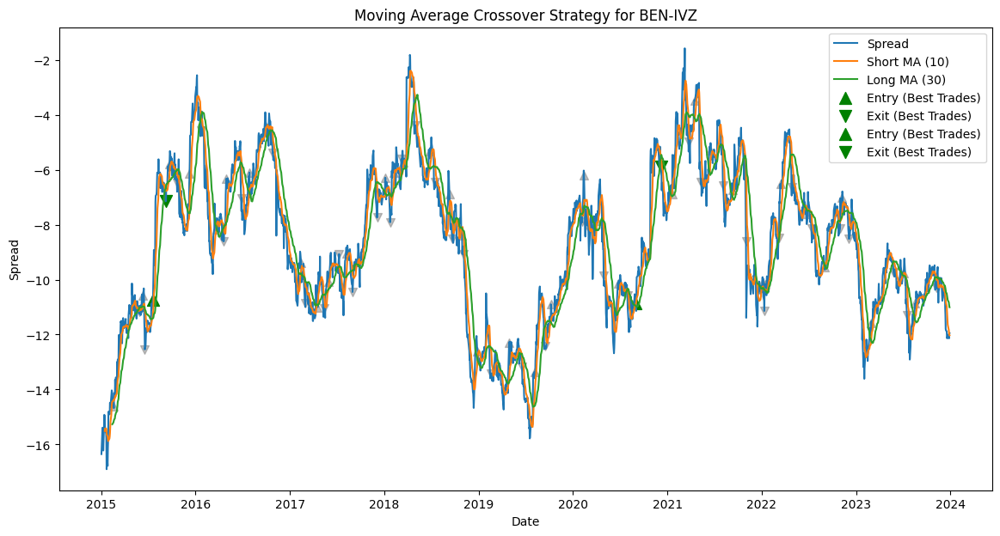


Trade Statistics for BEN-IVZ using Moving Average Crossover:
Total Trades: 40
Profitable Trades: 16
Losing Trades: 24
Win Rate: 40.00%
Average Trade Return: -2.77%
Average Winning Trade Return: 19.61%
Average Losing Trade Return: -17.70%

Testing pair: GOOG, GOOGL


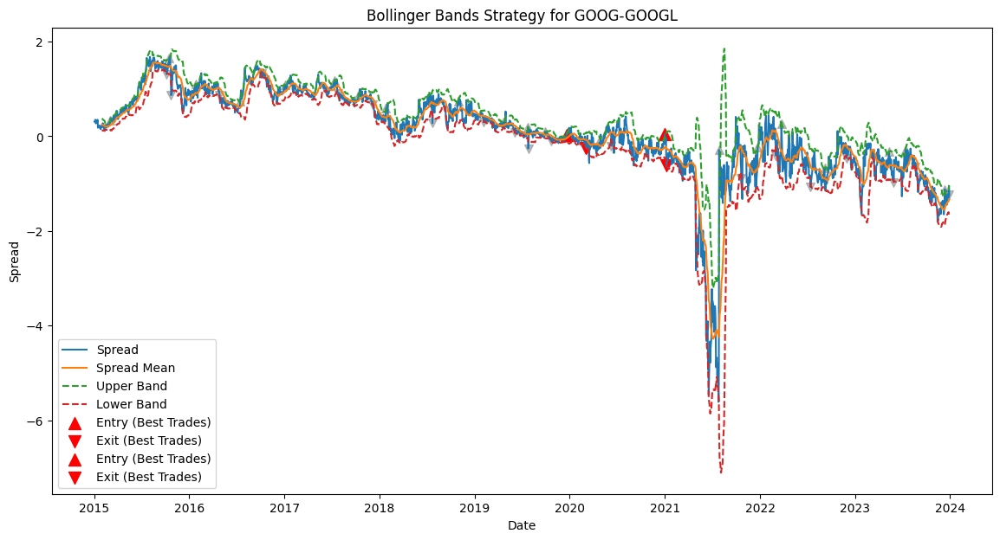


Trade Statistics for GOOG-GOOGL using Bollinger Bands:
Total Trades: 22
Profitable Trades: 19
Losing Trades: 3
Win Rate: 86.36%
Average Trade Return: 219.08%
Average Winning Trade Return: 274.66%
Average Losing Trade Return: -132.90%


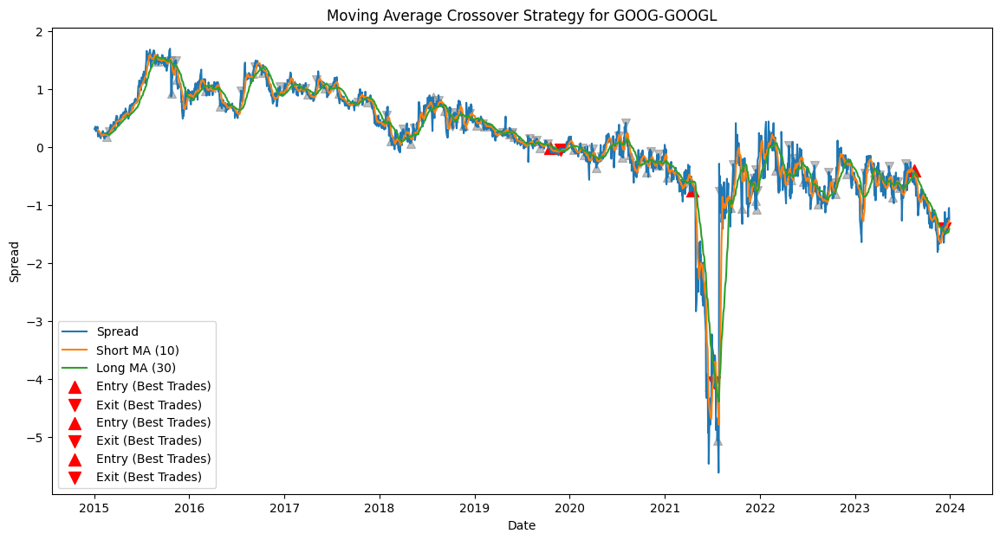


Trade Statistics for GOOG-GOOGL using Moving Average Crossover:
Total Trades: 54
Profitable Trades: 15
Losing Trades: 39
Win Rate: 27.78%
Average Trade Return: -34.84%
Average Winning Trade Return: 82.49%
Average Losing Trade Return: -79.96%

Testing pair: KO, PEP


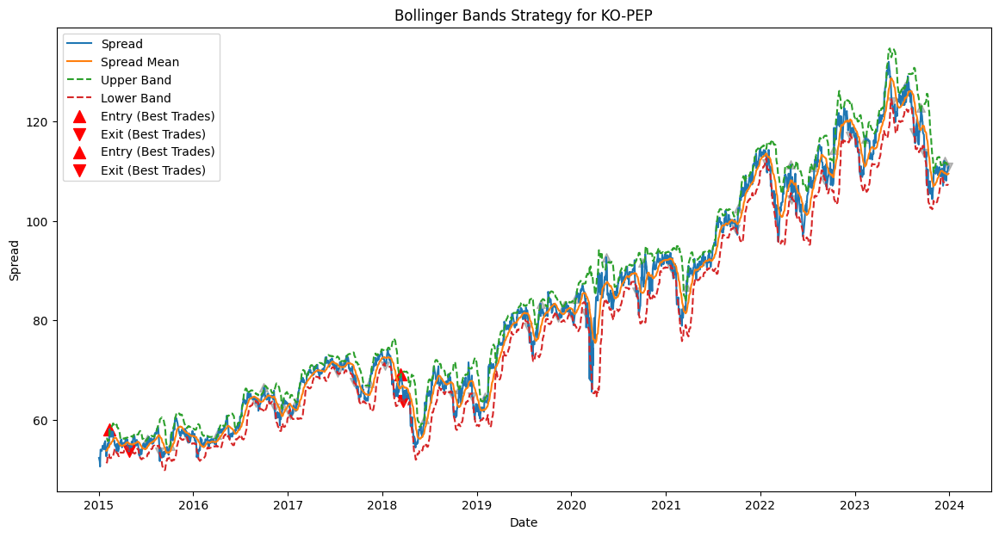


Trade Statistics for KO-PEP using Bollinger Bands:
Total Trades: 27
Profitable Trades: 17
Losing Trades: 10
Win Rate: 62.96%
Average Trade Return: -0.34%
Average Winning Trade Return: 4.71%
Average Losing Trade Return: -8.93%


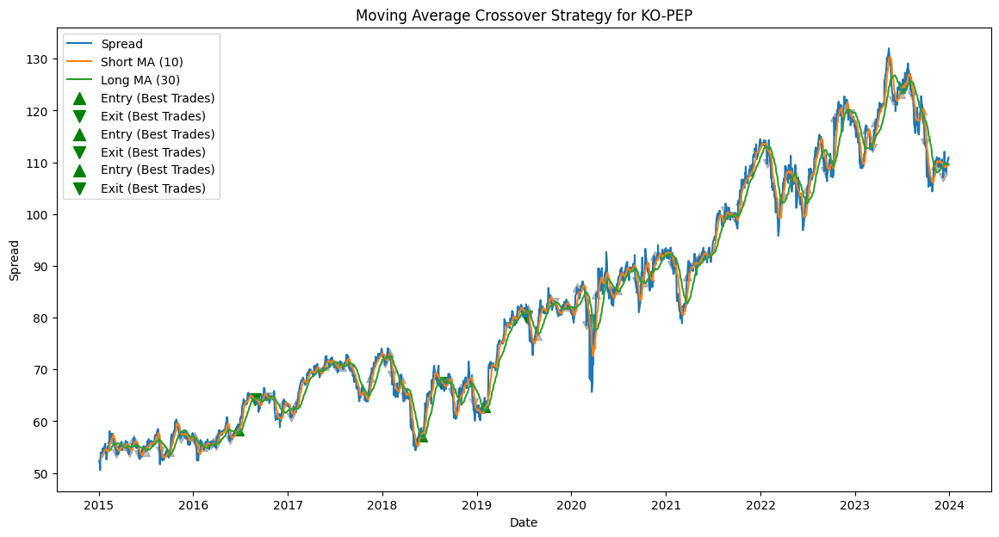


Trade Statistics for KO-PEP using Moving Average Crossover:
Total Trades: 42
Profitable Trades: 18
Losing Trades: 24
Win Rate: 42.86%
Average Trade Return: 1.15%
Average Winning Trade Return: 6.42%
Average Losing Trade Return: -2.81%

Testing pair: BLDR, LEN


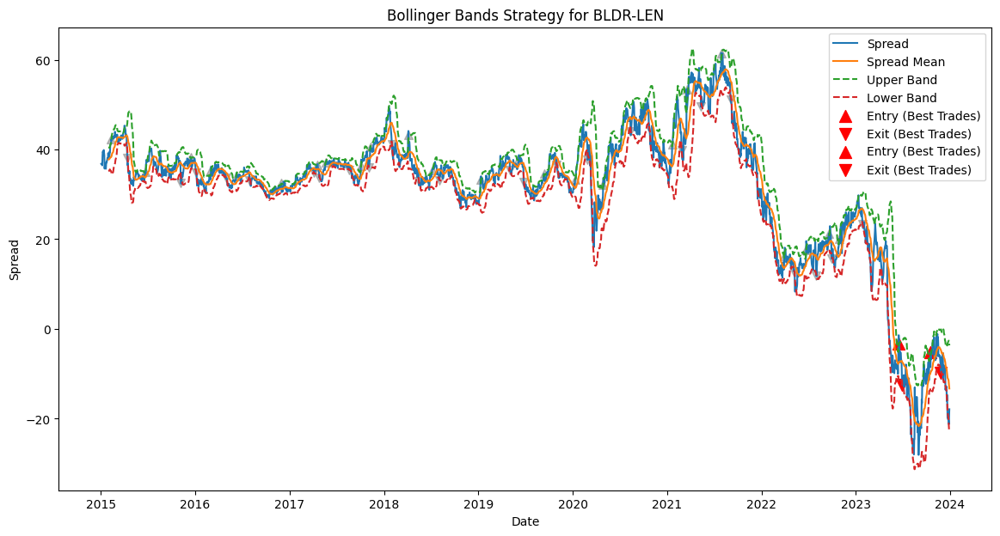


Trade Statistics for BLDR-LEN using Bollinger Bands:
Total Trades: 26
Profitable Trades: 19
Losing Trades: 7
Win Rate: 73.08%
Average Trade Return: 18.80%
Average Winning Trade Return: 30.27%
Average Losing Trade Return: -12.32%


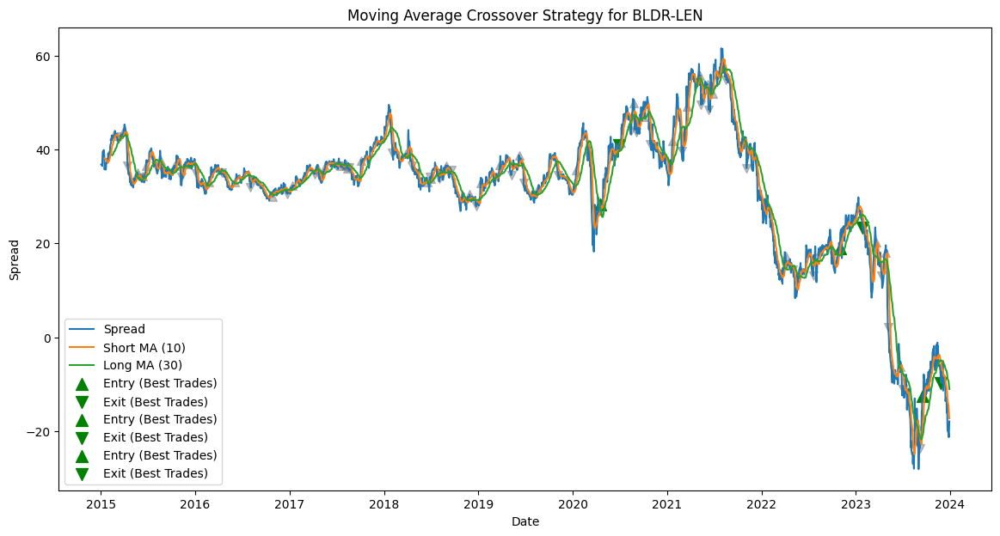


Trade Statistics for BLDR-LEN using Moving Average Crossover:
Total Trades: 47
Profitable Trades: 18
Losing Trades: 29
Win Rate: 38.30%
Average Trade Return: -5.45%
Average Winning Trade Return: 8.63%
Average Losing Trade Return: -14.20%

Testing pair: HBAN, NTRS


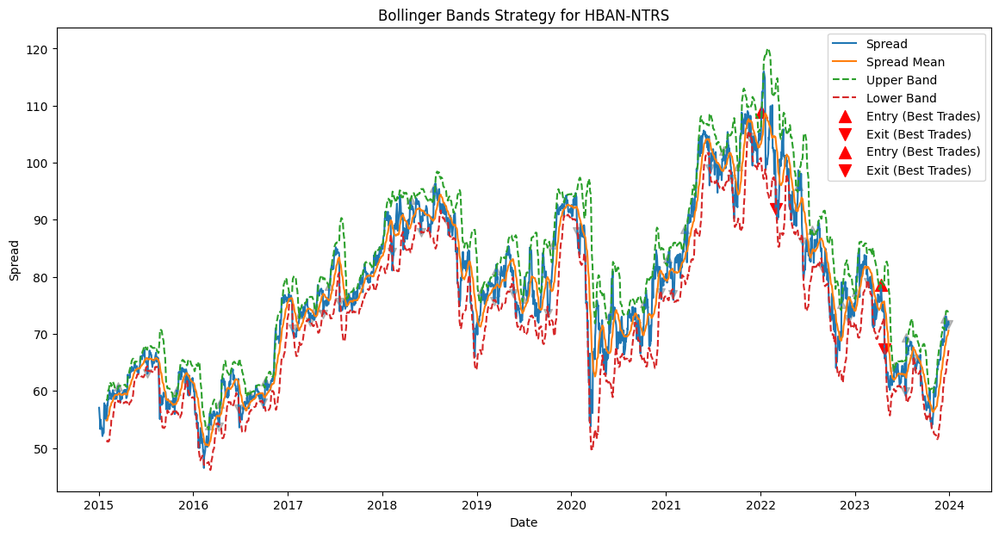


Trade Statistics for HBAN-NTRS using Bollinger Bands:
Total Trades: 31
Profitable Trades: 22
Losing Trades: 9
Win Rate: 70.97%
Average Trade Return: 1.92%
Average Winning Trade Return: 5.21%
Average Losing Trade Return: -6.13%


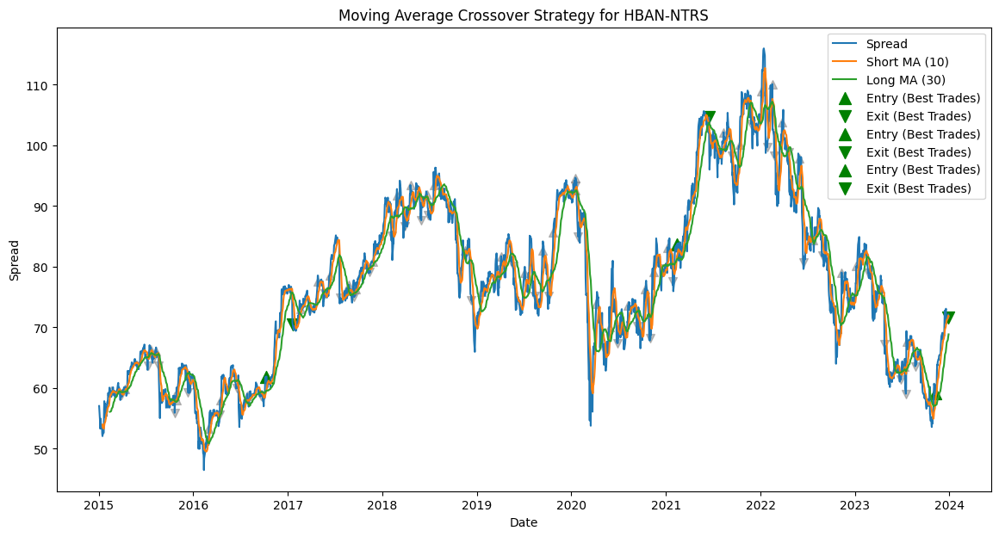


Trade Statistics for HBAN-NTRS using Moving Average Crossover:
Total Trades: 49
Profitable Trades: 15
Losing Trades: 34
Win Rate: 30.61%
Average Trade Return: -1.85%
Average Winning Trade Return: 6.84%
Average Losing Trade Return: -5.69%

Testing pair: DUK, LNT


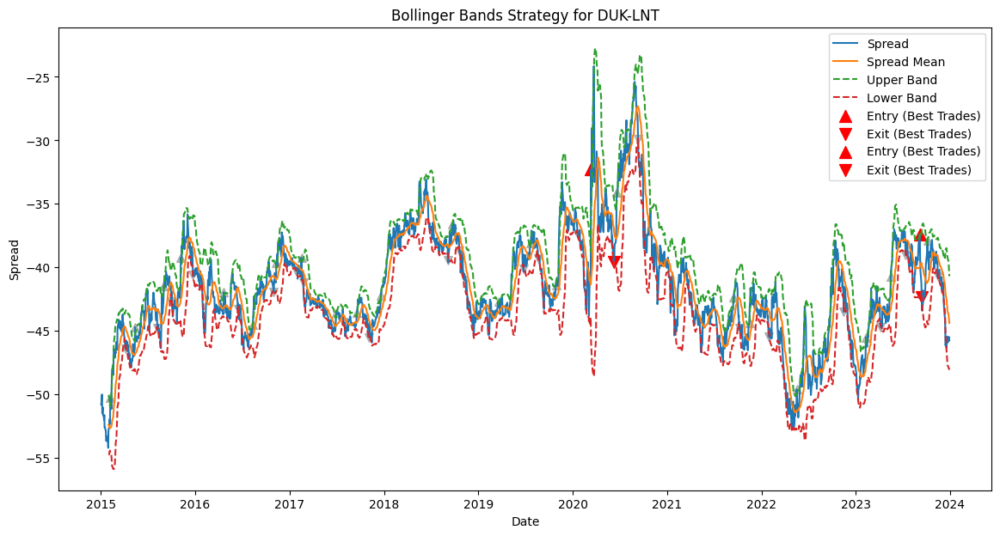


Trade Statistics for DUK-LNT using Bollinger Bands:
Total Trades: 24
Profitable Trades: 15
Losing Trades: 9
Win Rate: 62.50%
Average Trade Return: 0.69%
Average Winning Trade Return: 5.51%
Average Losing Trade Return: -7.33%


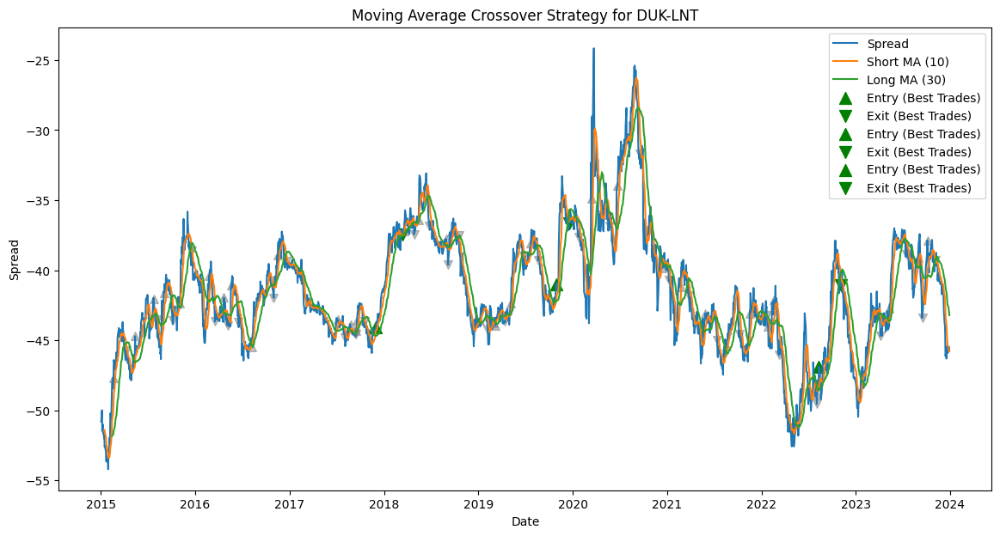


Trade Statistics for DUK-LNT using Moving Average Crossover:
Total Trades: 45
Profitable Trades: 17
Losing Trades: 28
Win Rate: 37.78%
Average Trade Return: 0.14%
Average Winning Trade Return: 5.68%
Average Losing Trade Return: -3.23%

Testing pair: A, MTD


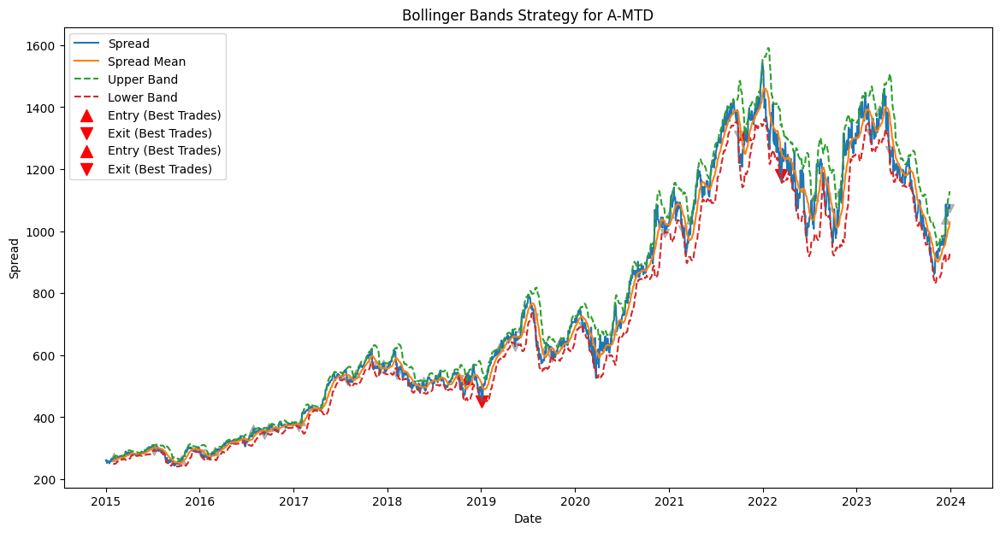


Trade Statistics for A-MTD using Bollinger Bands:
Total Trades: 22
Profitable Trades: 7
Losing Trades: 15
Win Rate: 31.82%
Average Trade Return: -5.28%
Average Winning Trade Return: 7.96%
Average Losing Trade Return: -11.46%


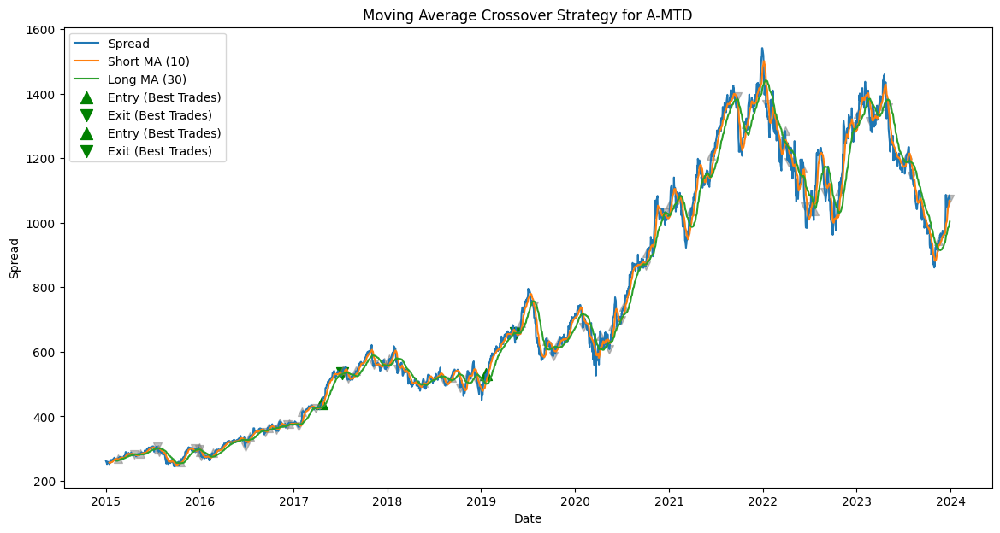


Trade Statistics for A-MTD using Moving Average Crossover:
Total Trades: 40
Profitable Trades: 22
Losing Trades: 18
Win Rate: 55.00%
Average Trade Return: 3.30%
Average Winning Trade Return: 9.45%
Average Losing Trade Return: -4.22%

Testing pair: ACGL, EG


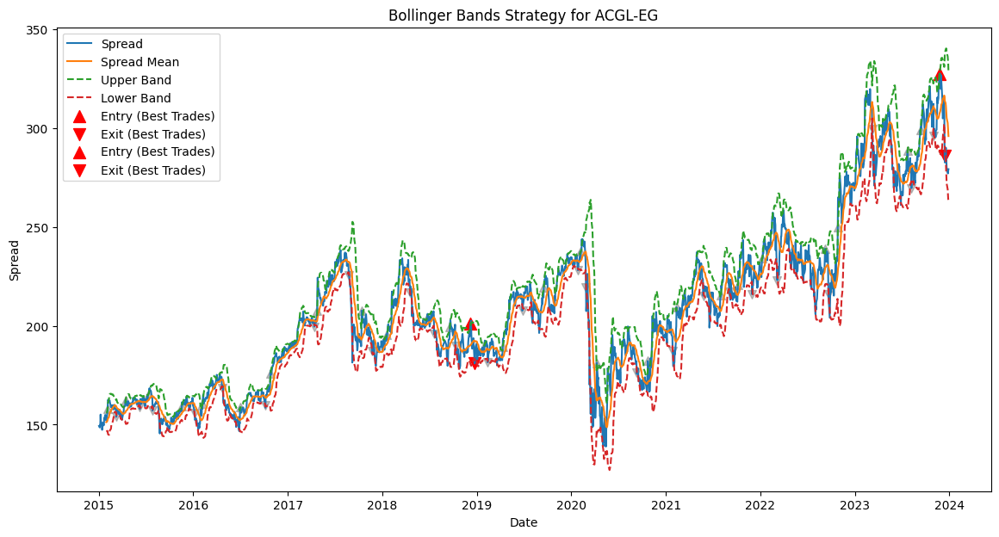


Trade Statistics for ACGL-EG using Bollinger Bands:
Total Trades: 28
Profitable Trades: 17
Losing Trades: 11
Win Rate: 60.71%
Average Trade Return: 0.49%
Average Winning Trade Return: 5.43%
Average Losing Trade Return: -7.15%


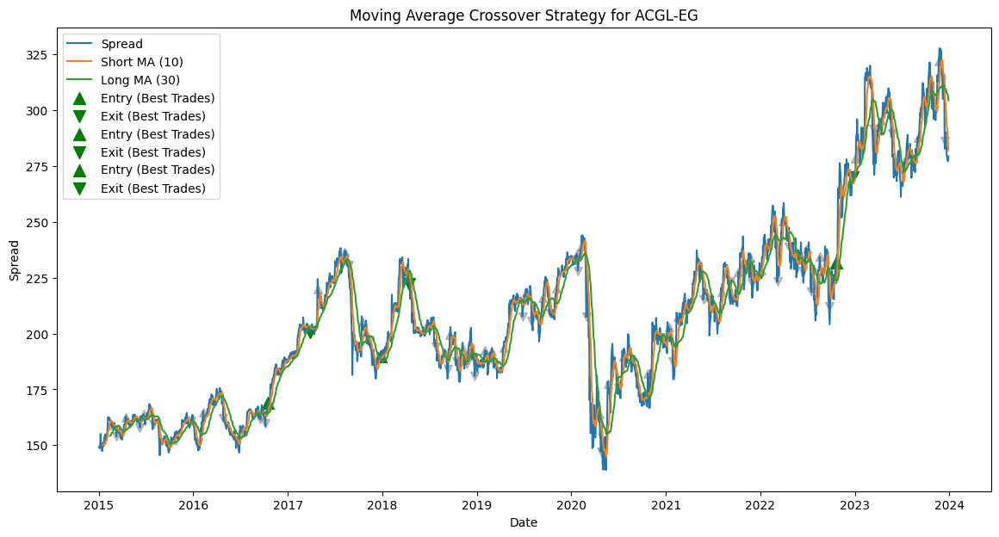


Trade Statistics for ACGL-EG using Moving Average Crossover:
Total Trades: 46
Profitable Trades: 14
Losing Trades: 32
Win Rate: 30.43%
Average Trade Return: -0.81%
Average Winning Trade Return: 7.42%
Average Losing Trade Return: -4.41%

Testing pair: CTRA, MRO


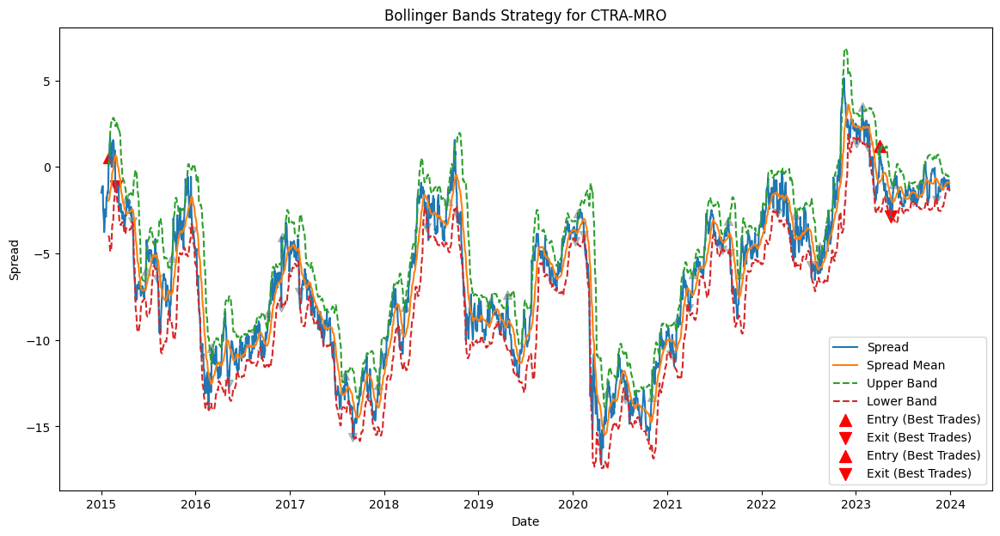


Trade Statistics for CTRA-MRO using Bollinger Bands:
Total Trades: 27
Profitable Trades: 17
Losing Trades: 10
Win Rate: 62.96%
Average Trade Return: 38.35%
Average Winning Trade Return: 83.77%
Average Losing Trade Return: -38.86%


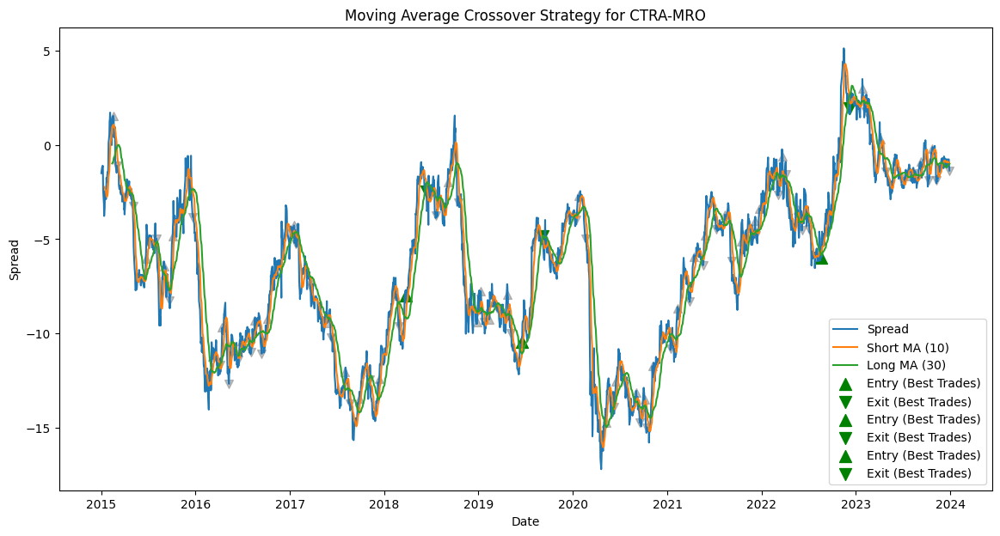


Trade Statistics for CTRA-MRO using Moving Average Crossover:
Total Trades: 51
Profitable Trades: 18
Losing Trades: 33
Win Rate: 35.29%
Average Trade Return: -42.21%
Average Winning Trade Return: 26.35%
Average Losing Trade Return: -79.60%

Testing pair: CDNS, SNPS


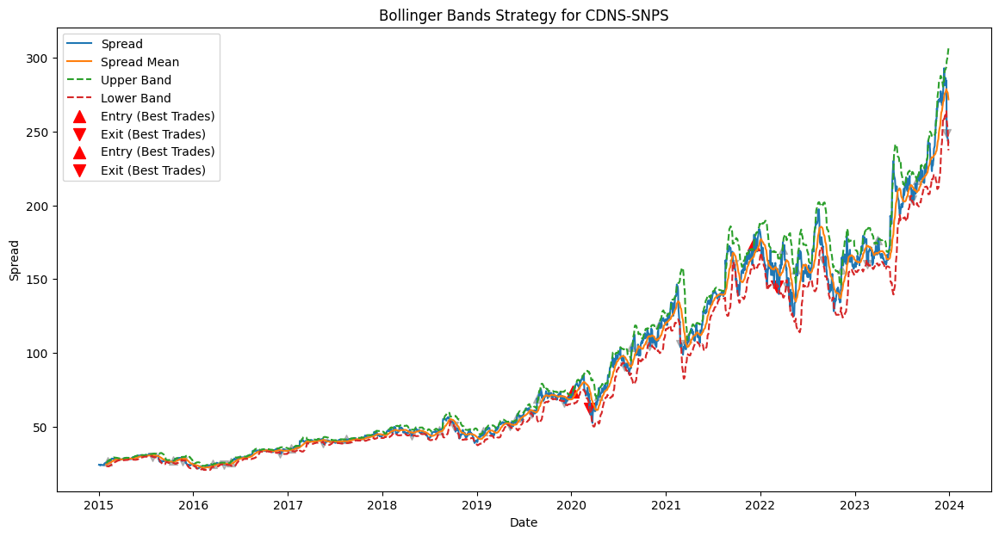


Trade Statistics for CDNS-SNPS using Bollinger Bands:
Total Trades: 21
Profitable Trades: 7
Losing Trades: 14
Win Rate: 33.33%
Average Trade Return: -5.14%
Average Winning Trade Return: 9.29%
Average Losing Trade Return: -12.36%


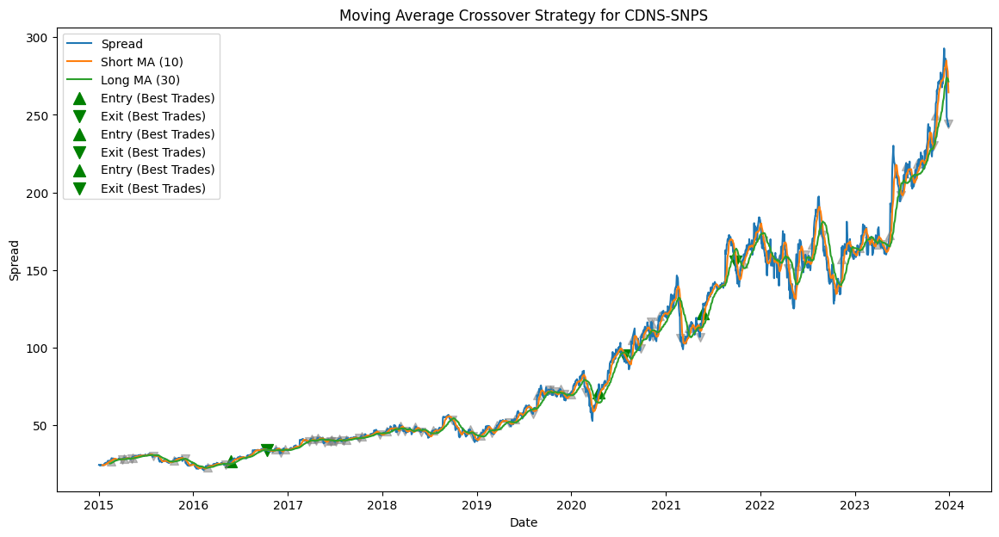


Trade Statistics for CDNS-SNPS using Moving Average Crossover:
Total Trades: 45
Profitable Trades: 26
Losing Trades: 19
Win Rate: 57.78%
Average Trade Return: 2.58%
Average Winning Trade Return: 8.12%
Average Losing Trade Return: -4.99%

Testing pair: CFG, HBAN


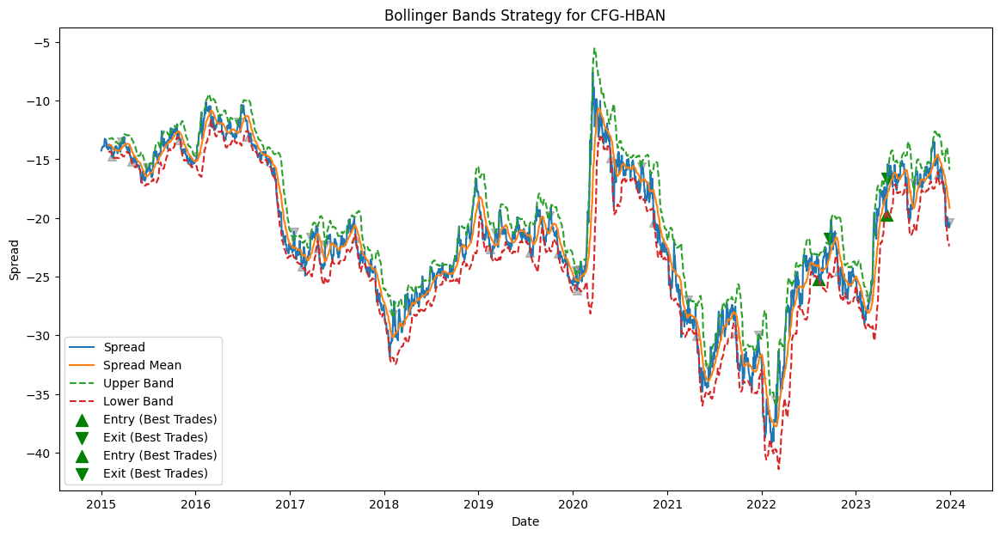


Trade Statistics for CFG-HBAN using Bollinger Bands:
Total Trades: 22
Profitable Trades: 10
Losing Trades: 12
Win Rate: 45.45%
Average Trade Return: -5.53%
Average Winning Trade Return: 7.88%
Average Losing Trade Return: -16.71%


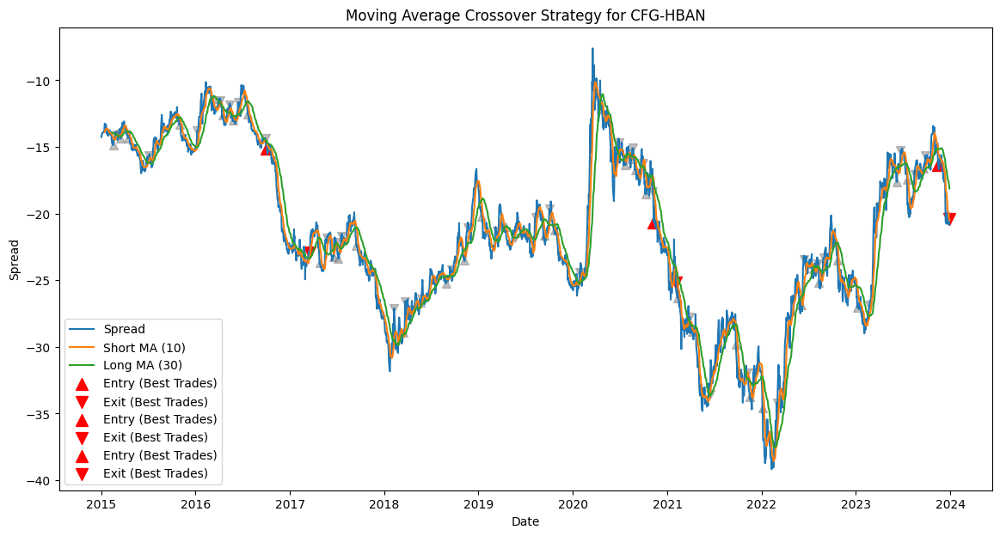


Trade Statistics for CFG-HBAN using Moving Average Crossover:
Total Trades: 42
Profitable Trades: 16
Losing Trades: 26
Win Rate: 38.10%
Average Trade Return: 1.93%
Average Winning Trade Return: 14.27%
Average Losing Trade Return: -5.66%

Testing pair: CMS, LNT


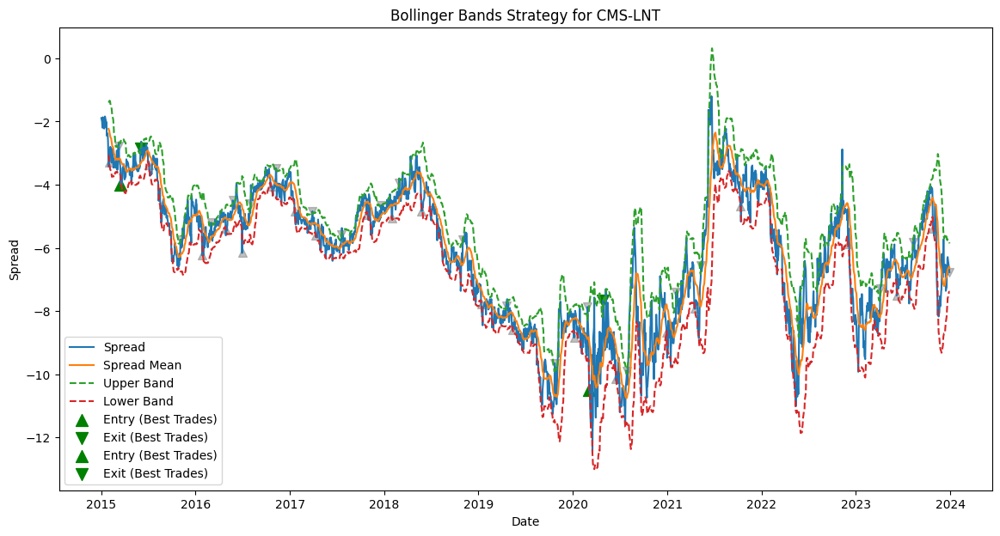


Trade Statistics for CMS-LNT using Bollinger Bands:
Total Trades: 23
Profitable Trades: 16
Losing Trades: 7
Win Rate: 69.57%
Average Trade Return: 0.43%
Average Winning Trade Return: 15.00%
Average Losing Trade Return: -32.90%


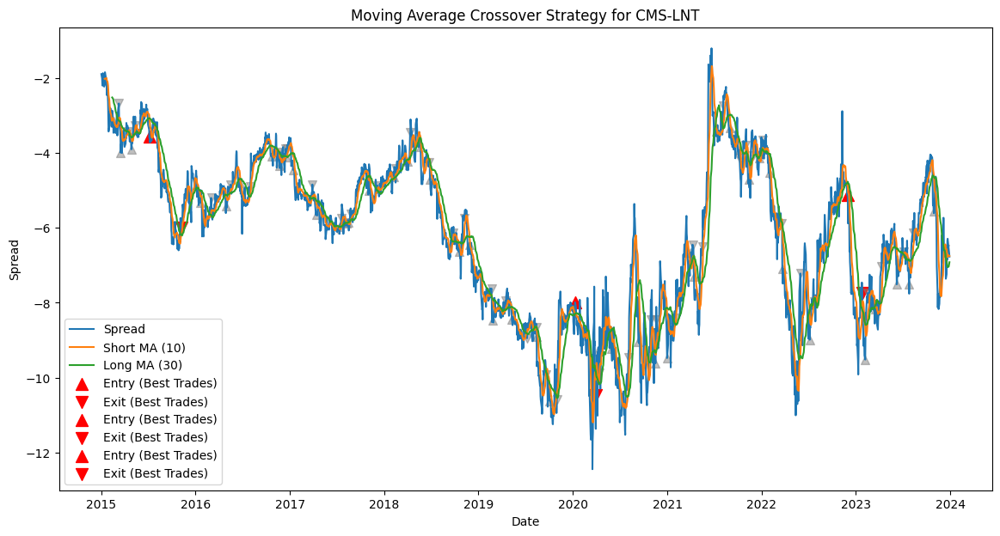


Trade Statistics for CMS-LNT using Moving Average Crossover:
Total Trades: 49
Profitable Trades: 18
Losing Trades: 31
Win Rate: 36.73%
Average Trade Return: 0.57%
Average Winning Trade Return: 18.21%
Average Losing Trade Return: -9.67%

Testing pair: IR, PH


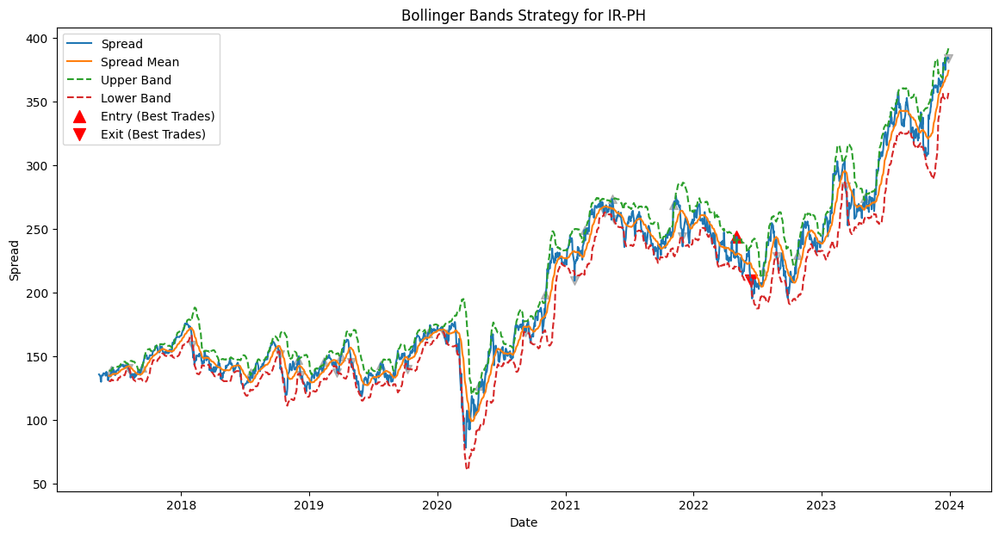


Trade Statistics for IR-PH using Bollinger Bands:
Total Trades: 17
Profitable Trades: 8
Losing Trades: 9
Win Rate: 47.06%
Average Trade Return: -5.09%
Average Winning Trade Return: 6.21%
Average Losing Trade Return: -15.13%


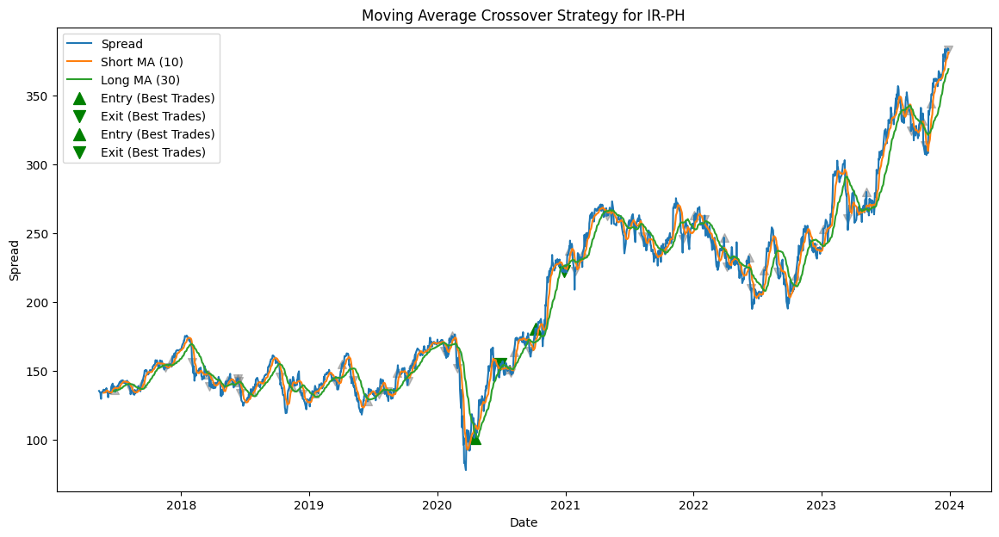


Trade Statistics for IR-PH using Moving Average Crossover:
Total Trades: 34
Profitable Trades: 16
Losing Trades: 18
Win Rate: 47.06%
Average Trade Return: 2.35%
Average Winning Trade Return: 10.48%
Average Losing Trade Return: -4.88%

Testing pair: DUK, SRE


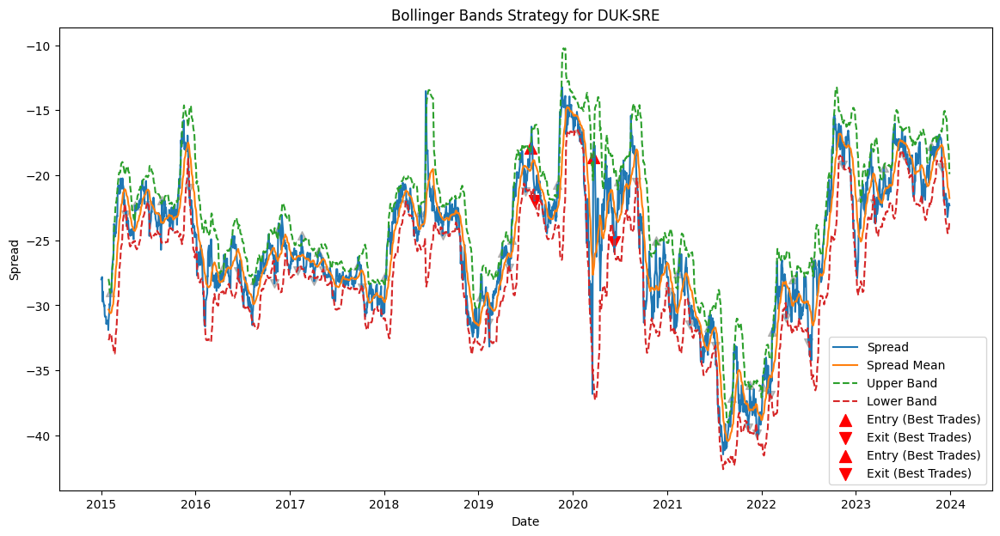


Trade Statistics for DUK-SRE using Bollinger Bands:
Total Trades: 30
Profitable Trades: 22
Losing Trades: 8
Win Rate: 73.33%
Average Trade Return: 2.99%
Average Winning Trade Return: 9.24%
Average Losing Trade Return: -14.22%


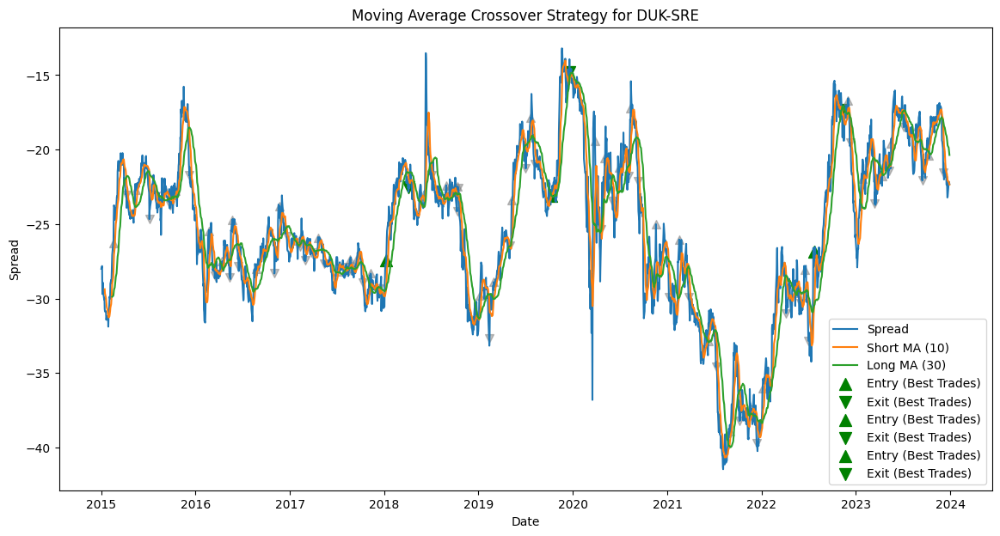


Trade Statistics for DUK-SRE using Moving Average Crossover:
Total Trades: 48
Profitable Trades: 13
Losing Trades: 35
Win Rate: 27.08%
Average Trade Return: -3.27%
Average Winning Trade Return: 11.80%
Average Losing Trade Return: -8.87%


In [ ]:
# Backtest both strategies on the top 20 cointegrated pairs
final_results = []

for pair, p_value in top_cointegrated_pairs:
    stock1, stock2 = pair
    print(f"\nTesting pair: {stock1}, {stock2}")

    # Fetch data for the selected pair
    try:
        stock1_close = data_dict[stock1]['Close']
        stock2_close = data_dict[stock2]['Close']
    except KeyError:
        print(f"Data for {stock1} or {stock2} not found.")
        continue

    # Align the data
    pair_data = pd.DataFrame({stock1: stock1_close, stock2: stock2_close}).dropna()

    # Ensure there is enough data
    if len(pair_data) < 60:  # Minimum length for strategies
        print(f"Not enough data for pair {stock1}, {stock2}")
        continue

    # Strategy 1: Bollinger Bands
    signals_bb, spread_bb = bollinger_bands_strategy(pair_data, stock1, stock2)
    results_bb = backtest_strategy(pair_data, stock1, stock2, signals_bb, spread_bb, 'Bollinger Bands')
    final_results.append(results_bb)

    # Strategy 2: Moving Average Crossover
    signals_mac, spread_mac = moving_average_crossover_strategy(pair_data, stock1, stock2)
    results_mac = backtest_strategy(pair_data, stock1, stock2, signals_mac, spread_mac, 'Moving Average Crossover')
    final_results.append(results_mac)


In [ ]:
# Convert results to DataFrame
final_results_df = pd.DataFrame(final_results)

# Display the results sorted by Sharpe Ratio
final_results_df = final_results_df.sort_values(by='Sharpe Ratio', ascending=False)
print("\nFinal Performance Summary:")
print(final_results_df[['Pair', 'Strategy', 'Total Return', 'Sharpe Ratio', 'Sortino Ratio', 'Number of Trades', 'Win Rate (%)', 'Average Trade Return (%)']])



Final Performance Summary:
          Pair                  Strategy  Total Return  Sharpe Ratio  \
10    CFG-NTRS           Bollinger Bands    437.840493      0.857116   
18    BLDR-LEN           Bollinger Bands    954.696850      0.797571   
8     EOG-FANG           Bollinger Bands    233.531685      0.603250   
20   HBAN-NTRS           Bollinger Bands     87.892010      0.413081   
2      WEC-XEL           Bollinger Bands     39.967475      0.409213   
23     DUK-LNT  Moving Average Crossover     42.471425      0.400002   
16      KO-PEP           Bollinger Bands     35.680904      0.324101   
34     CMS-LNT           Bollinger Bands     26.034906      0.313603   
4     FITB-PNC           Bollinger Bands     34.901135      0.276489   
36       IR-PH           Bollinger Bands     25.372109      0.260663   
0       HD-PLD           Bollinger Bands     34.497753      0.257917   
33    CFG-HBAN  Moving Average Crossover     27.883791      0.239056   
30   CDNS-SNPS           Bollinger B

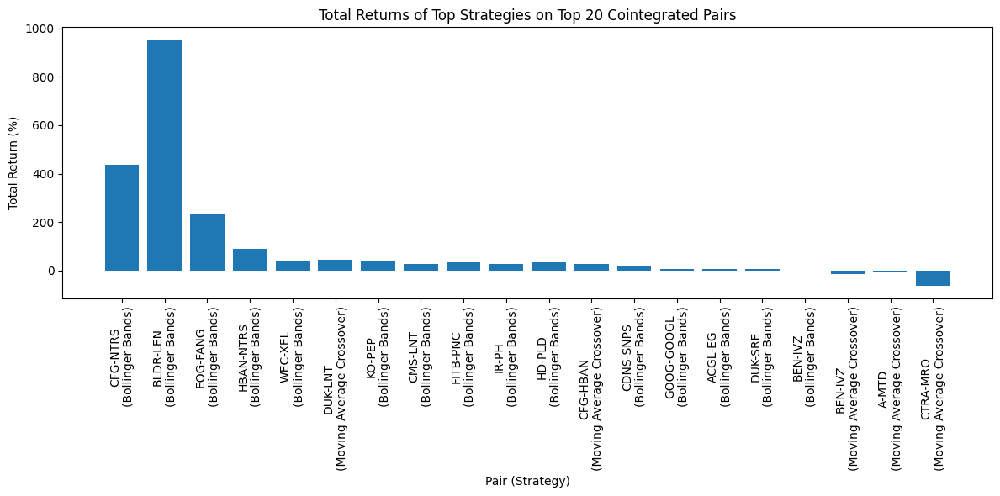

In [ ]:
# Plot cumulative returns for the top strategies
plt.figure(figsize=(12, 6))
top_strategies = final_results_df.head(20)  # Get top 20 strategies
bars = plt.bar(top_strategies['Pair'] + '\n(' + top_strategies['Strategy'] + ')', top_strategies['Total Return'])

# Add labels and title
plt.title('Total Returns of Top Strategies on Top 20 Cointegrated Pairs')
plt.xlabel('Pair (Strategy)')
plt.ylabel('Total Return (%)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [ ]:
# Identify the most profitable strategy based on Sharpe Ratio
best_strategy = final_results_df.iloc[0]
print("\nMost Profitable Strategy:")
print(best_strategy)



Most Profitable Strategy:
Pair                               CFG-NTRS
Strategy                    Bollinger Bands
Total Return                     437.840493
Sharpe Ratio                       0.857116
Sortino Ratio                      1.167942
Number of Trades                       56.5
Win Rate (%)                      72.413793
Average Trade Return (%)           3.679266
Name: 10, dtype: object


In [ ]:
def hyperparameter_sweep(pair_data, stock1, stock2, strategy_name, param_grid):
    results_list = []
    for params in param_grid:
        if strategy_name == 'Bollinger Bands':
            window_size = params.get('window_size', 20)
            num_std_dev = params.get('num_std_dev', 2)
            # Modify the strategy function to accept parameters
            signals, spread = bollinger_bands_strategy_with_params(pair_data, stock1, stock2, window_size, num_std_dev)
        elif strategy_name == 'Moving Average Crossover':
            short_window = params.get('short_window', 10)
            long_window = params.get('long_window', 30)
            # Modify the strategy function to accept parameters
            signals, spread = moving_average_crossover_strategy_with_params(pair_data, stock1, stock2, short_window, long_window)
        else:
            continue
        results = backtest_strategy(pair_data, stock1, stock2, signals, spread, strategy_name)
        results.update(params)
        results_list.append(results)
    return pd.DataFrame(results_list)


In [ ]:
# Bollinger Bands Strategy with parameters
def bollinger_bands_strategy_with_params(pair_data, stock1, stock2, window_size, num_std_dev):
    # Calculate the spread
    spread = pair_data[stock2] - pair_data[stock1]

    # Calculate Bollinger Bands
    spread_mean = spread.rolling(window_size).mean()
    spread_std = spread.rolling(window_size).std()
    upper_band = spread_mean + num_std_dev * spread_std
    lower_band = spread_mean - num_std_dev * spread_std

    # Generate signals
    signals = pd.DataFrame(index=spread.index)
    signals['Position'] = 0

    # Generate buy signals
    signals['Position'][window_size:] = np.where(spread[window_size:] < lower_band[window_size:], 1, 0)

    # Generate sell signals
    signals['Position'][window_size:] = np.where(spread[window_size:] > upper_band[window_size:], -1, signals['Position'][window_size:])

    # Forward fill positions
    signals['Position'] = signals['Position'].replace(to_replace=0, method='ffill')

    return signals, spread

# Moving Average Crossover Strategy with parameters
def moving_average_crossover_strategy_with_params(pair_data, stock1, stock2, short_window, long_window):
    # Calculate the spread
    spread = pair_data[stock2] - pair_data[stock1]

    # Calculate moving averages
    spread_short_ma = spread.rolling(window=short_window).mean()
    spread_long_ma = spread.rolling(window=long_window).mean()

    # Generate signals
    signals = pd.DataFrame(index=spread.index)
    signals['Position'] = 0

    # Signal generation
    signals['Position'][long_window:] = np.where(spread_short_ma[long_window:] > spread_long_ma[long_window:], 1, -1)

    return signals, spread



Performing hyperparameter sweep on Bollinger Bands strategy for pair CFG-NTRS


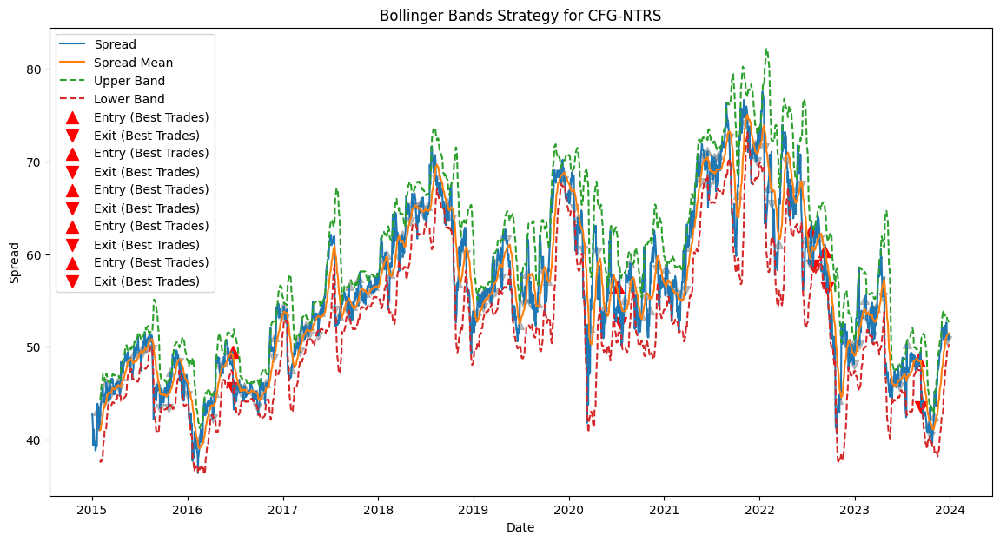


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 93
Profitable Trades: 54
Losing Trades: 39
Win Rate: 58.06%
Average Trade Return: -0.32%
Average Winning Trade Return: 3.17%
Average Losing Trade Return: -5.14%


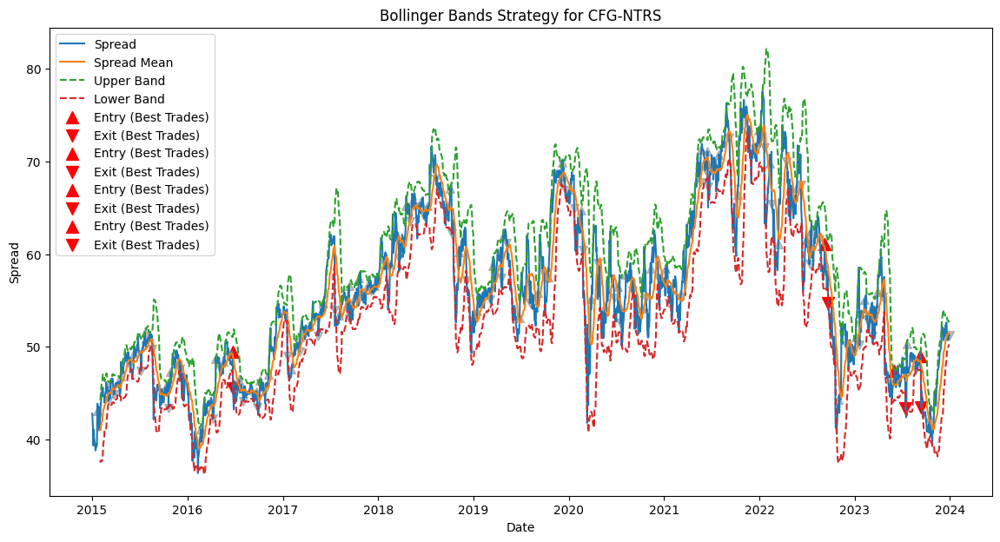


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 70
Profitable Trades: 44
Losing Trades: 26
Win Rate: 62.86%
Average Trade Return: 0.38%
Average Winning Trade Return: 4.01%
Average Losing Trade Return: -5.76%


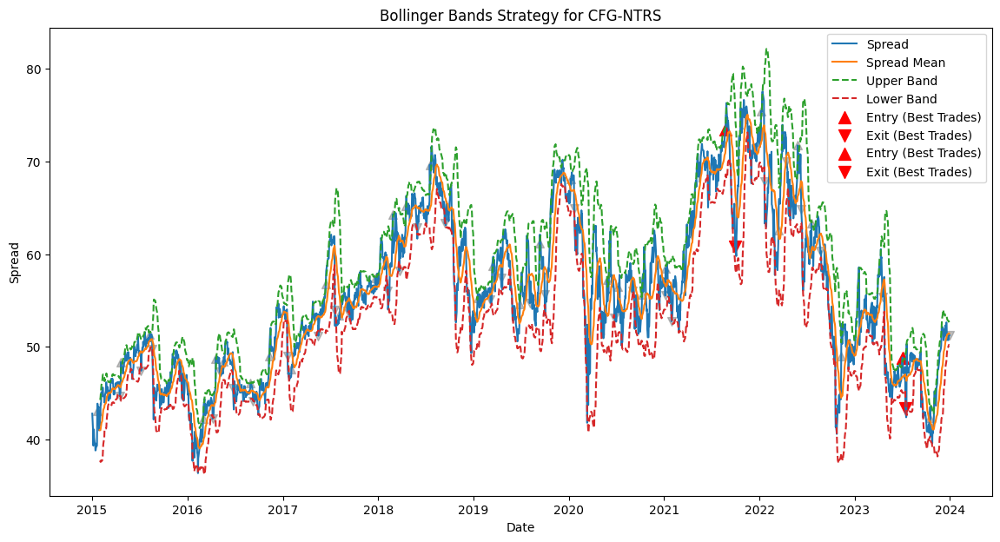


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 32
Profitable Trades: 23
Losing Trades: 9
Win Rate: 71.88%
Average Trade Return: 2.39%
Average Winning Trade Return: 5.87%
Average Losing Trade Return: -6.51%


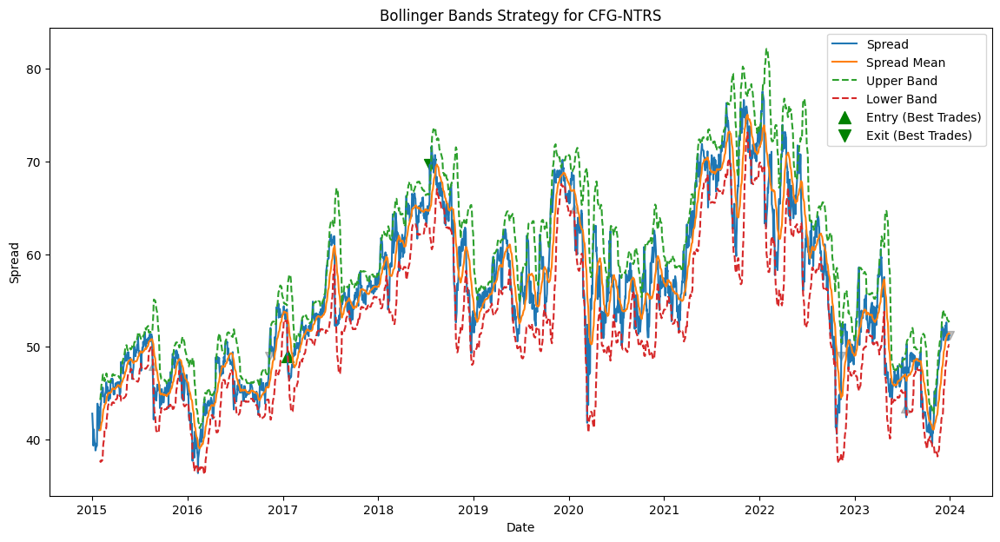


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 4
Profitable Trades: 3
Losing Trades: 1
Win Rate: 75.00%
Average Trade Return: 9.43%
Average Winning Trade Return: 20.76%
Average Losing Trade Return: -24.54%
No trades executed for CFG-NTRS using Bollinger Bands


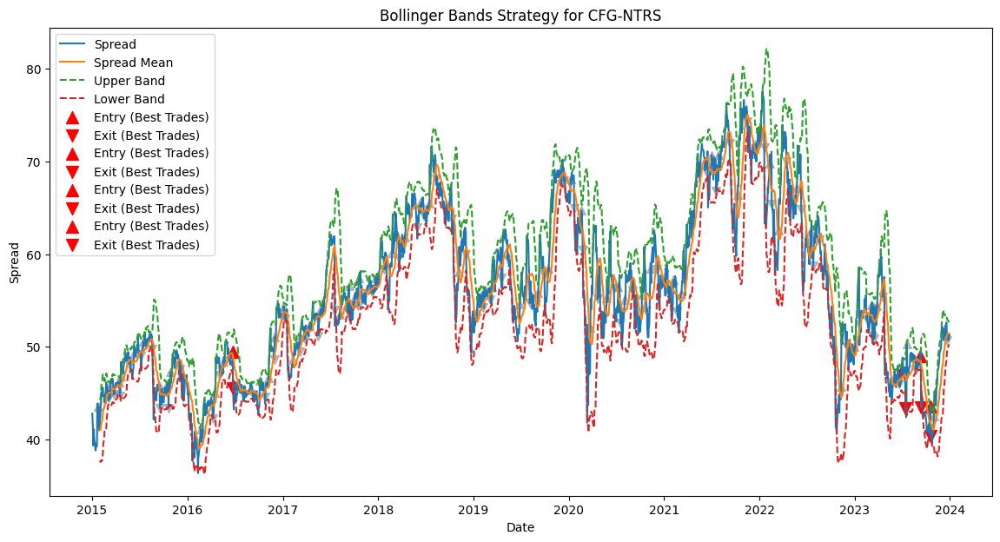


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 74
Profitable Trades: 44
Losing Trades: 30
Win Rate: 59.46%
Average Trade Return: 0.16%
Average Winning Trade Return: 3.70%
Average Losing Trade Return: -5.03%


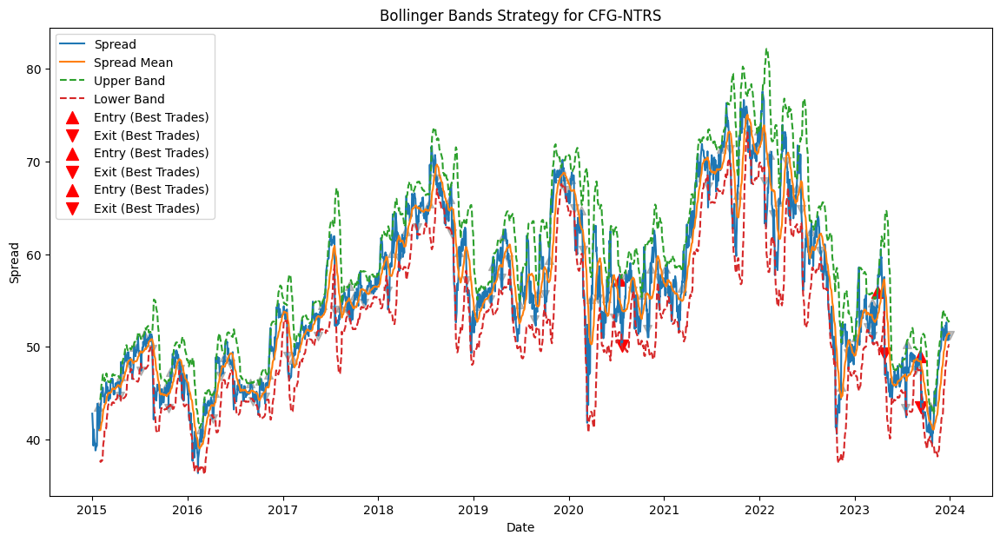


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 55
Profitable Trades: 38
Losing Trades: 17
Win Rate: 69.09%
Average Trade Return: 1.10%
Average Winning Trade Return: 4.36%
Average Losing Trade Return: -6.18%


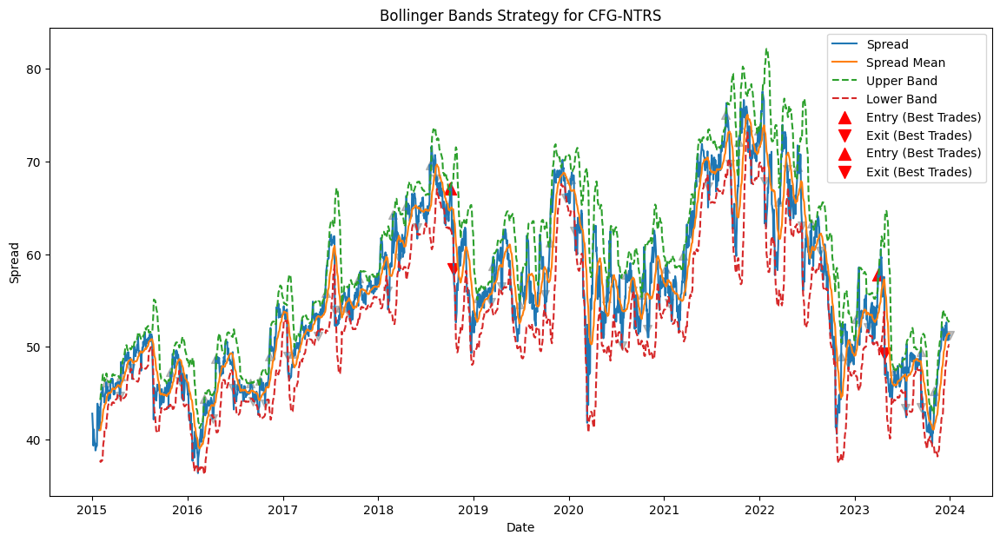


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 38
Profitable Trades: 29
Losing Trades: 9
Win Rate: 76.32%
Average Trade Return: 3.07%
Average Winning Trade Return: 5.66%
Average Losing Trade Return: -5.29%


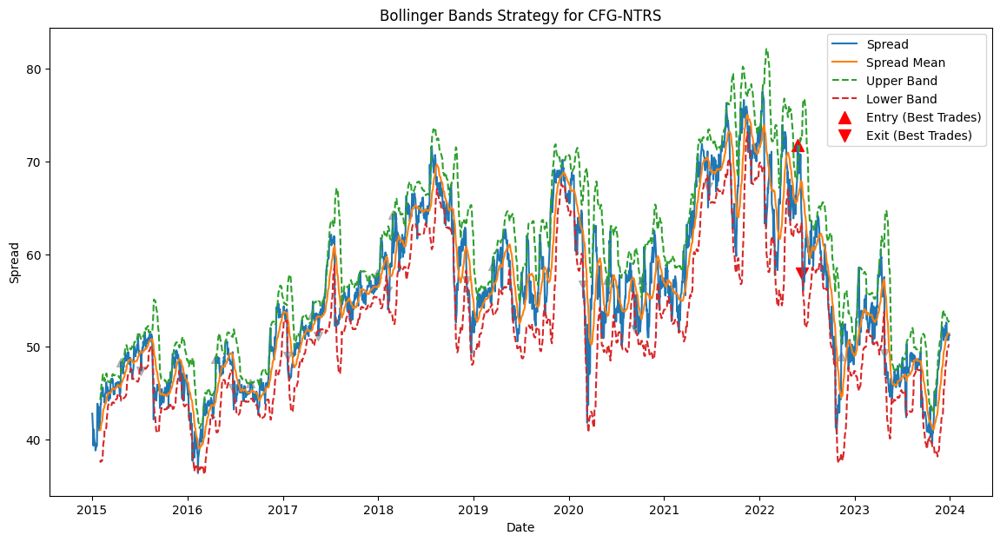


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 11
Profitable Trades: 8
Losing Trades: 3
Win Rate: 72.73%
Average Trade Return: 3.16%
Average Winning Trade Return: 7.40%
Average Losing Trade Return: -8.14%


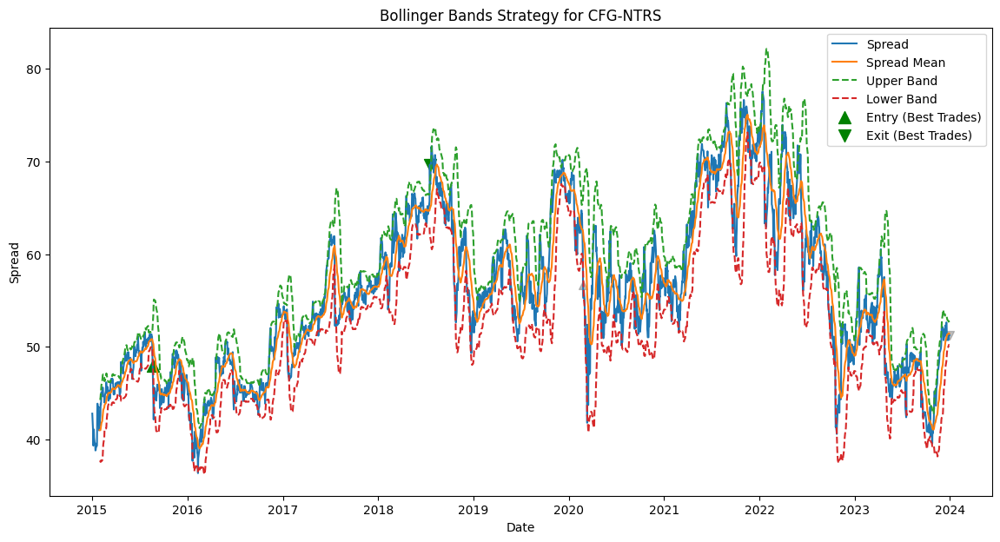


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 2
Profitable Trades: 1
Losing Trades: 1
Win Rate: 50.00%
Average Trade Return: 17.82%
Average Winning Trade Return: 45.26%
Average Losing Trade Return: -9.61%


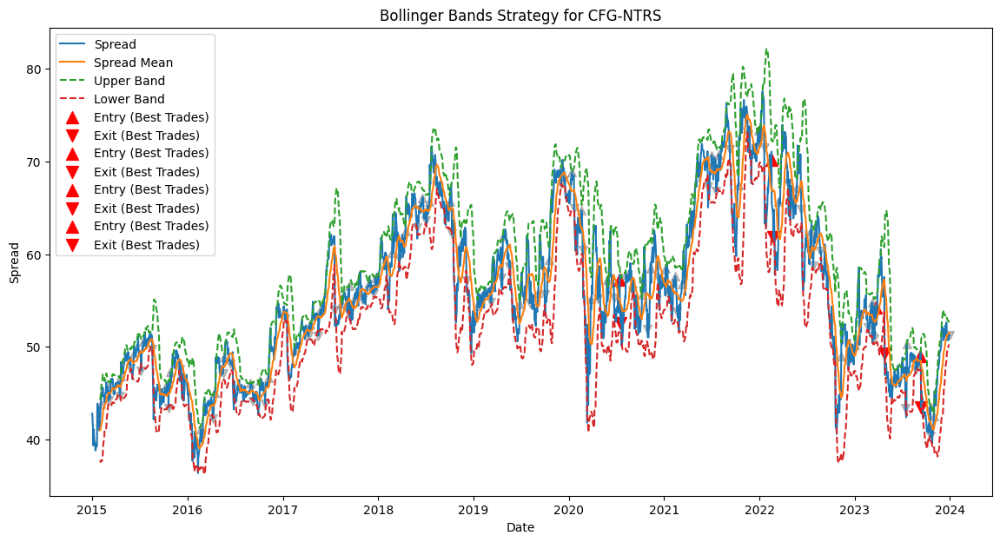


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 64
Profitable Trades: 44
Losing Trades: 20
Win Rate: 68.75%
Average Trade Return: 1.39%
Average Winning Trade Return: 4.38%
Average Losing Trade Return: -5.17%


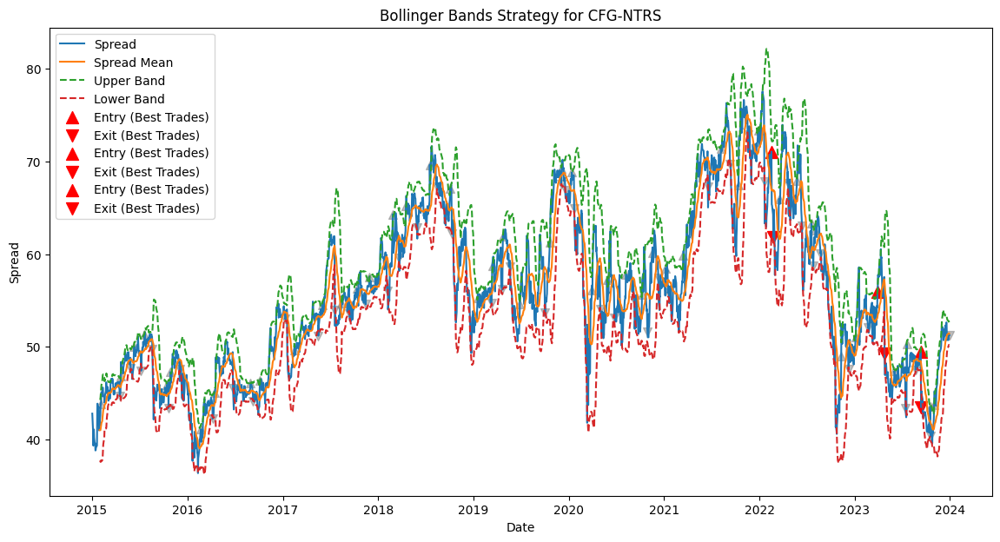


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 49
Profitable Trades: 36
Losing Trades: 13
Win Rate: 73.47%
Average Trade Return: 2.31%
Average Winning Trade Return: 5.33%
Average Losing Trade Return: -6.04%


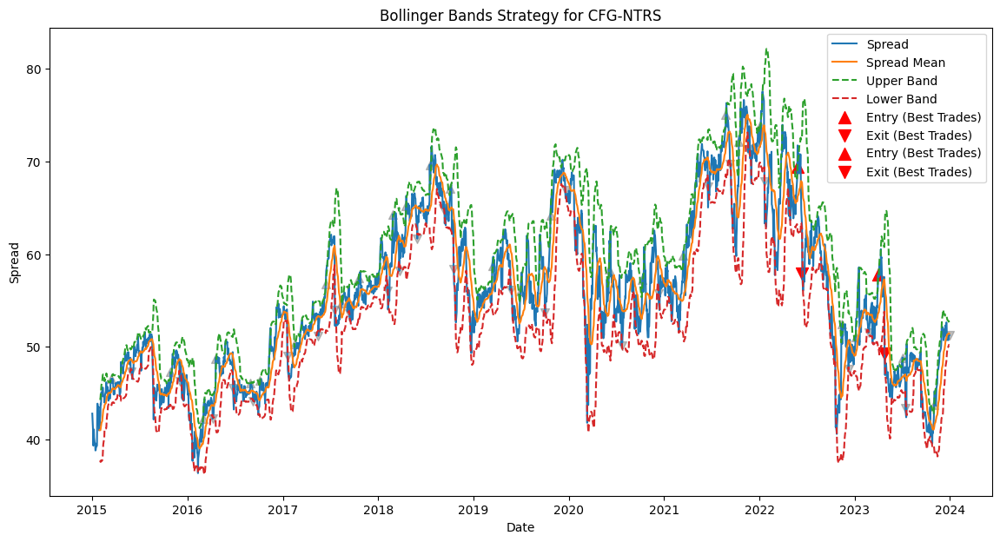


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 29
Profitable Trades: 21
Losing Trades: 8
Win Rate: 72.41%
Average Trade Return: 3.68%
Average Winning Trade Return: 7.17%
Average Losing Trade Return: -5.48%


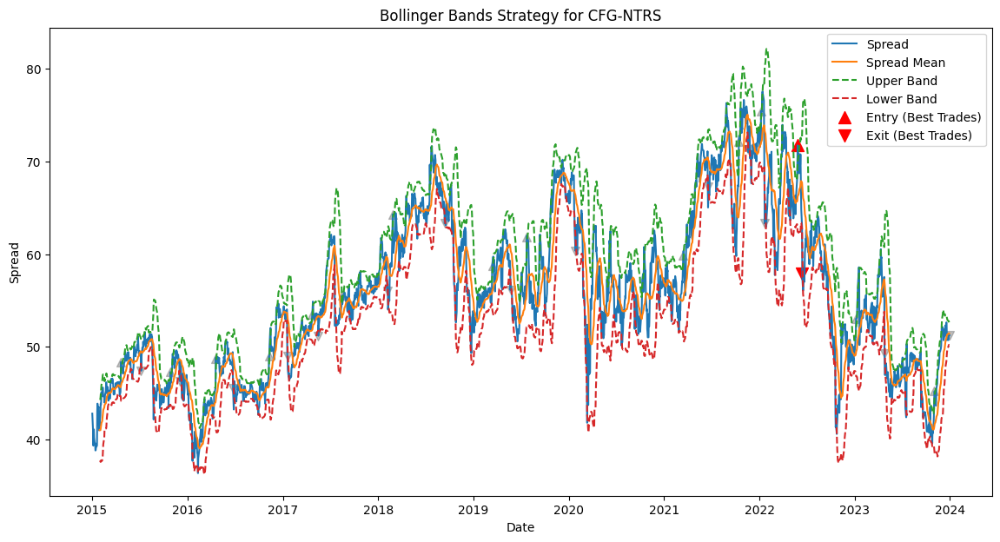


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 15
Profitable Trades: 11
Losing Trades: 4
Win Rate: 73.33%
Average Trade Return: 2.68%
Average Winning Trade Return: 6.08%
Average Losing Trade Return: -6.69%


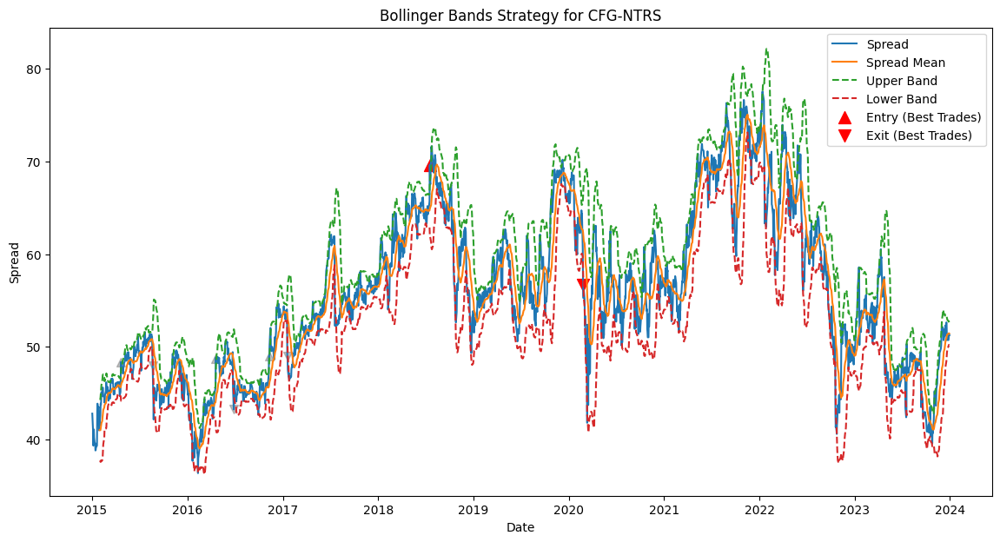


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 4
Profitable Trades: 3
Losing Trades: 1
Win Rate: 75.00%
Average Trade Return: 7.66%
Average Winning Trade Return: 10.25%
Average Losing Trade Return: -0.10%


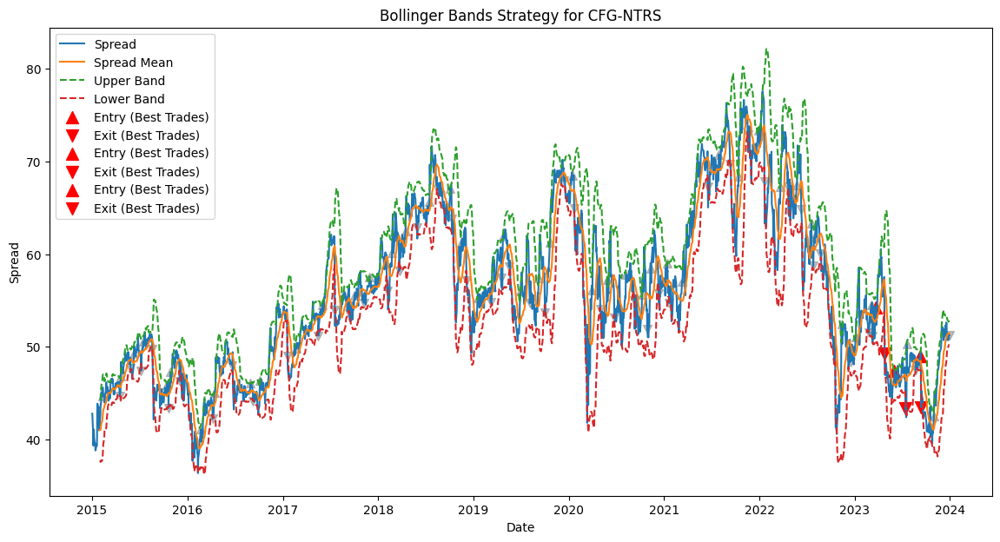


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 49
Profitable Trades: 34
Losing Trades: 15
Win Rate: 69.39%
Average Trade Return: 1.77%
Average Winning Trade Return: 4.92%
Average Losing Trade Return: -5.39%


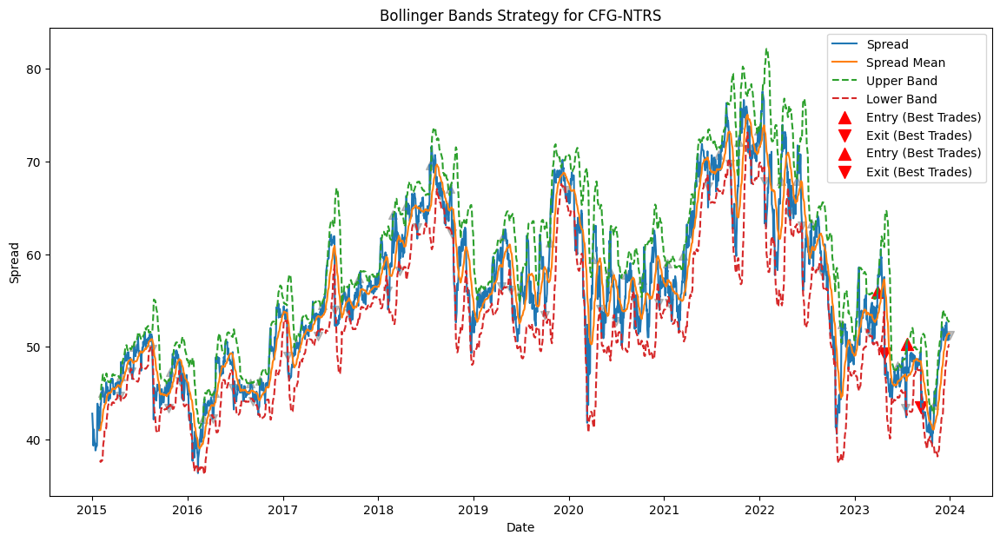


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 38
Profitable Trades: 29
Losing Trades: 9
Win Rate: 76.32%
Average Trade Return: 2.99%
Average Winning Trade Return: 5.62%
Average Losing Trade Return: -5.51%


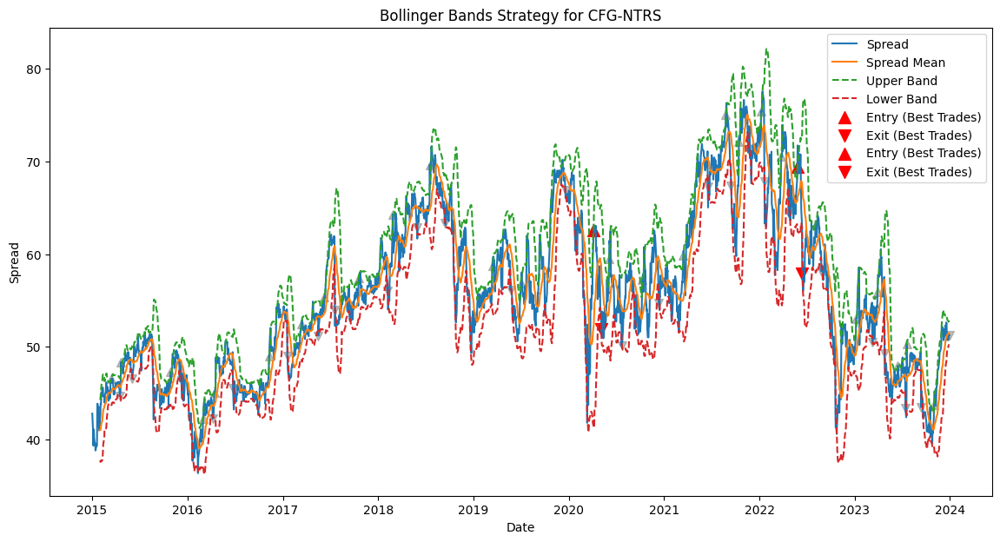


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 28
Profitable Trades: 22
Losing Trades: 6
Win Rate: 78.57%
Average Trade Return: 4.15%
Average Winning Trade Return: 7.49%
Average Losing Trade Return: -8.08%


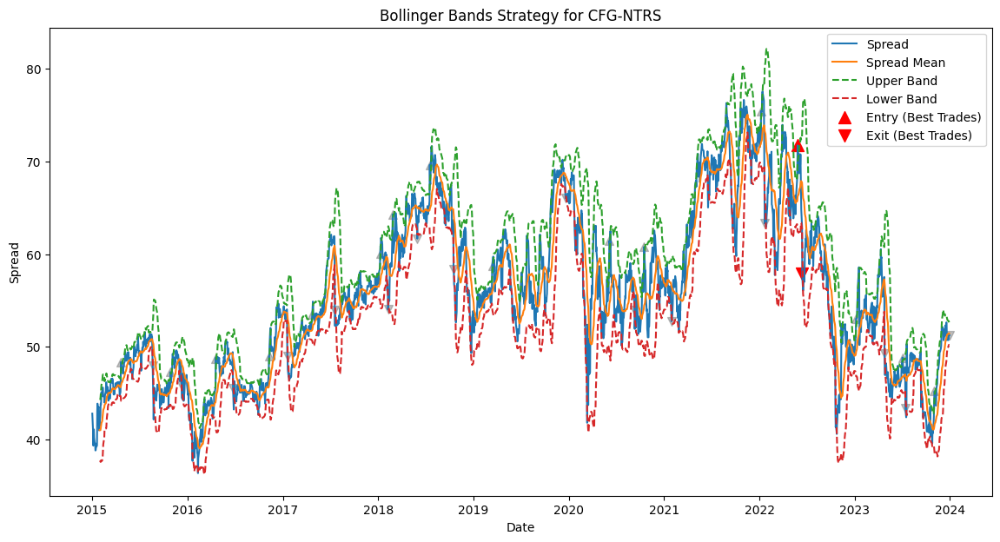


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 16
Profitable Trades: 12
Losing Trades: 4
Win Rate: 75.00%
Average Trade Return: 5.82%
Average Winning Trade Return: 9.98%
Average Losing Trade Return: -6.67%


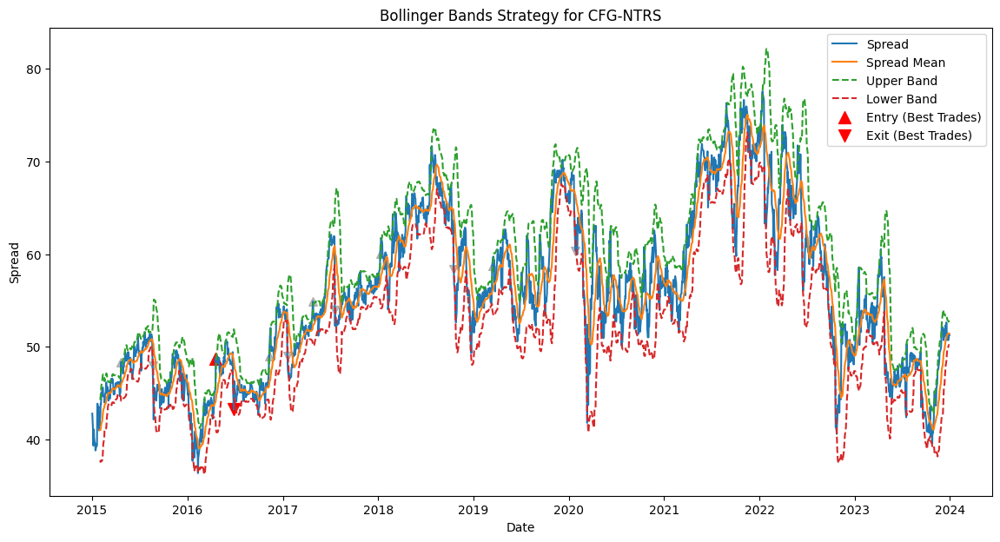


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 6
Profitable Trades: 4
Losing Trades: 2
Win Rate: 66.67%
Average Trade Return: 2.32%
Average Winning Trade Return: 4.19%
Average Losing Trade Return: -1.42%


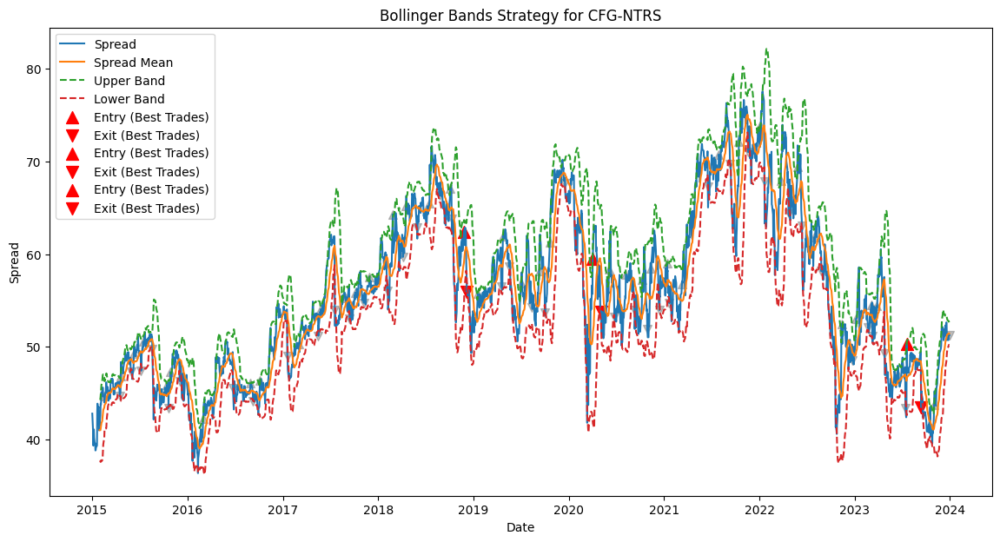


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 44
Profitable Trades: 34
Losing Trades: 10
Win Rate: 77.27%
Average Trade Return: 3.00%
Average Winning Trade Return: 5.80%
Average Losing Trade Return: -6.53%


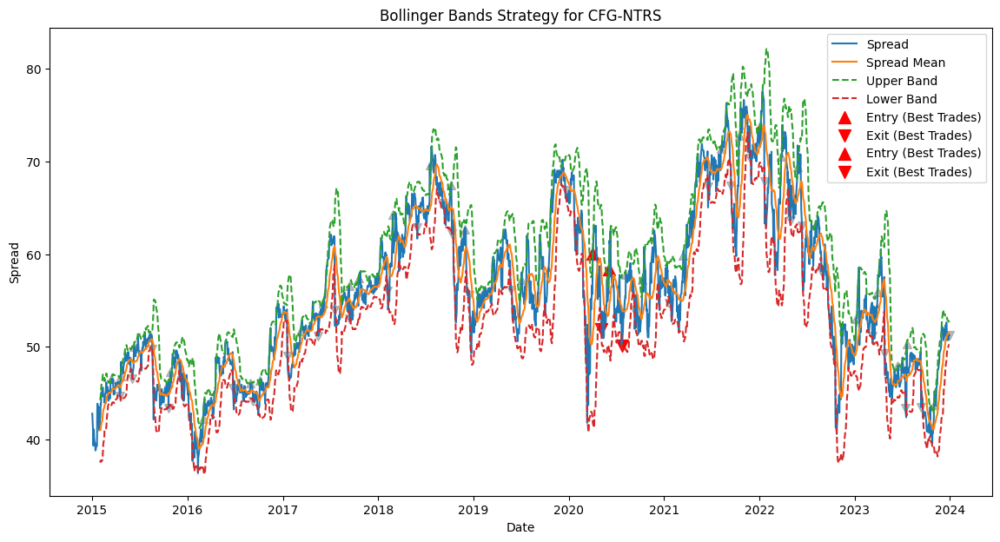


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 34
Profitable Trades: 28
Losing Trades: 6
Win Rate: 82.35%
Average Trade Return: 3.45%
Average Winning Trade Return: 6.33%
Average Losing Trade Return: -10.01%


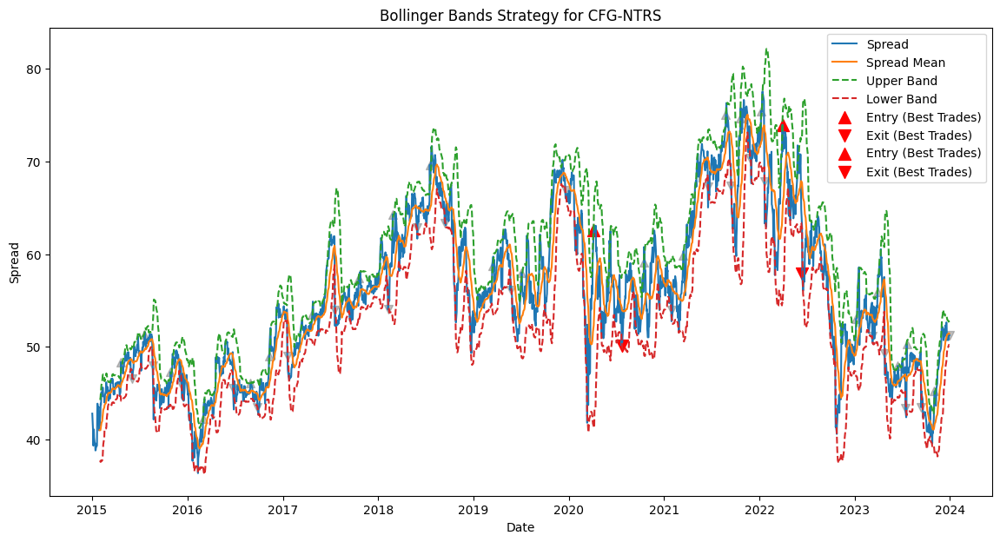


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 24
Profitable Trades: 18
Losing Trades: 6
Win Rate: 75.00%
Average Trade Return: 4.41%
Average Winning Trade Return: 8.64%
Average Losing Trade Return: -8.27%


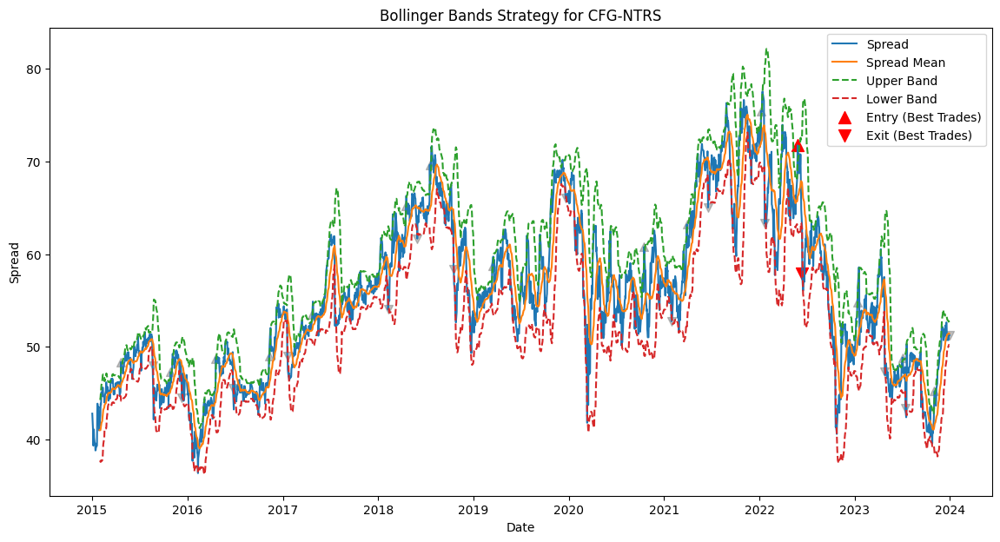


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 15
Profitable Trades: 10
Losing Trades: 5
Win Rate: 66.67%
Average Trade Return: 5.23%
Average Winning Trade Return: 10.81%
Average Losing Trade Return: -5.94%


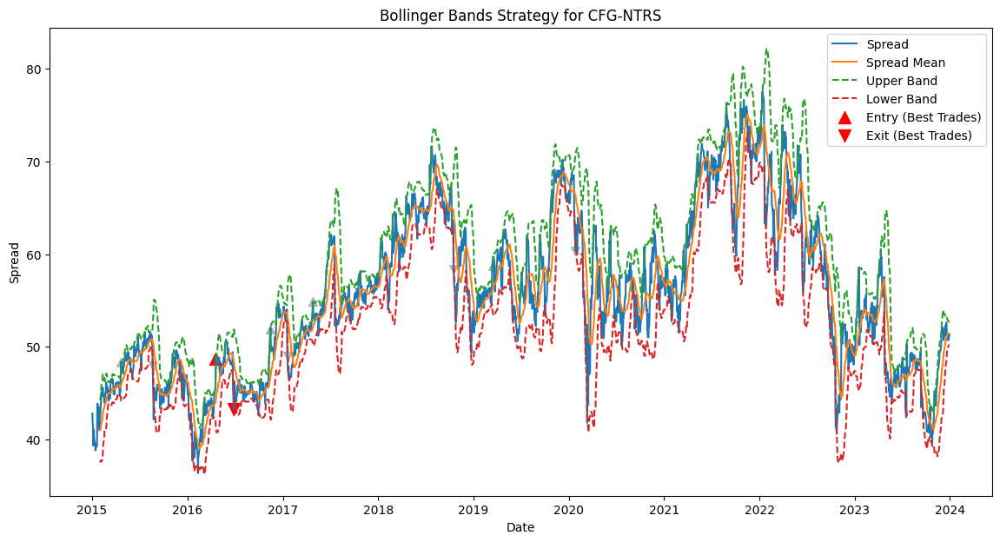


Trade Statistics for CFG-NTRS using Bollinger Bands:
Total Trades: 5
Profitable Trades: 3
Losing Trades: 2
Win Rate: 60.00%
Average Trade Return: 1.76%
Average Winning Trade Return: 5.94%
Average Losing Trade Return: -4.50%


In [ ]:
# Extract the best pair and strategy
best_pair = best_strategy['Pair'].split('-')  # Split the string to get the stock tickers
  # Convert string representation back to tuple
stock1, stock2 = best_pair
best_strategy_name = best_strategy['Strategy']

# Fetch data for the best pair
stock1_close = data_dict[stock1]['Close']
stock2_close = data_dict[stock2]['Close']
pair_data = pd.DataFrame({stock1: stock1_close, stock2: stock2_close}).dropna()

# Define parameter grid for hyperparameter sweep
if best_strategy_name == 'Moving Average Crossover':
    short_window_range = range(5, 21, 5)
    long_window_range = range(20, 61, 10)
    param_grid = [{'short_window': sw, 'long_window': lw} for sw in short_window_range for lw in long_window_range if sw < lw]
elif best_strategy_name == 'Bollinger Bands':
    window_size_range = range(10, 31, 5)
    num_std_dev_range = [1, 1.5, 2, 2.5, 3]
    param_grid = [{'window_size': ws, 'num_std_dev': nsd} for ws in window_size_range for nsd in num_std_dev_range]

# Perform hyperparameter sweep
print(f"\nPerforming hyperparameter sweep on {best_strategy_name} strategy for pair {stock1}-{stock2}")
hyperparameter_results_df = hyperparameter_sweep(pair_data, stock1, stock2, best_strategy_name, param_grid)

# Sort results by Sharpe Ratio
hyperparameter_results_df = hyperparameter_results_df.sort_values(by='Sharpe Ratio', ascending=False)



Top 10 Hyperparameter Combinations:


,Pair,Strategy,Total Return,Sharpe Ratio,Sortino Ratio,Number of Trades,Win Rate (%),Average Trade Return (%),window_size,num_std_dev
16,CFG-NTRS,Bollinger Bands,577.222148,0.955198,1.390736,74.5,76.315789,2.987929,25,1.5
21,CFG-NTRS,Bollinger Bands,558.095147,0.943950,1.381625,66.5,82.352941,3.450136,30,1.5
12,CFG-NTRS,Bollinger Bands,437.840493,0.857116,1.167942,56.5,72.413793,3.679266,20,2.0
22,CFG-NTRS,Bollinger Bands,410.583394,0.834559,1.241168,46.5,75.000000,4.409653,30,2.0
17,CFG-NTRS,Bollinger Bands,319.373187,0.748065,1.101777,54.5,78.571429,4.151055,25,2.0
11,CFG-NTRS,Bollinger Bands,310.433075,0.738250,1.052038,96.5,73.469388,2.314374,20,1.5
20,CFG-NTRS,Bollinger Bands,298.293983,0.725235,1.050056,86.5,77.272727,2.996268,30,1.0
7,CFG-NTRS,Bollinger Bands,206.230230,0.612136,0.851176,74.5,76.315789,3.069296,15,2.0
1,CFG-NTRS,Bollinger Bands,170.586447,0.557552,0.825976,138.5,62.857143,0.381096,10,1.5
23,CFG-NTRS,Bollinger Bands,147.611863,0.521086,0.700145,28.5,66.666667,5.230457,30,2.5


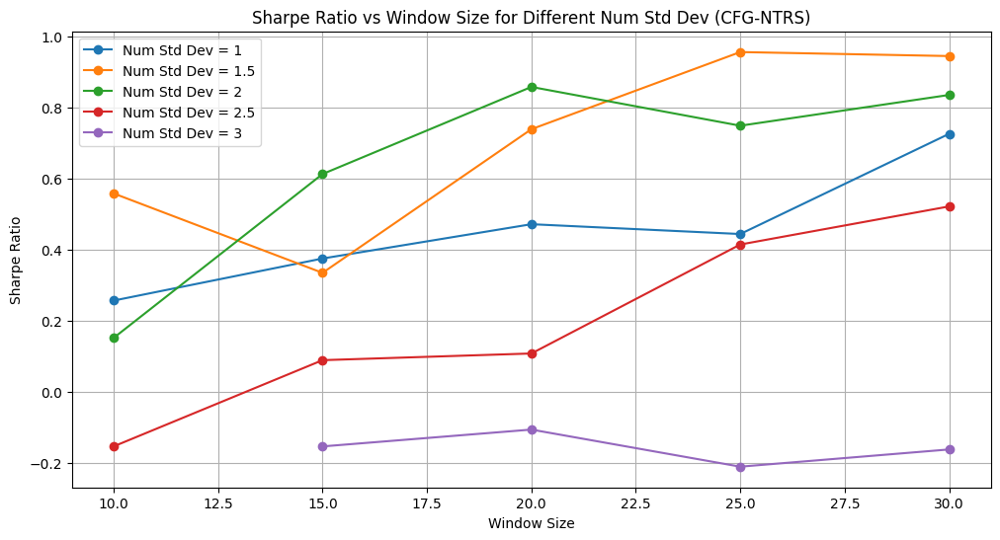

In [ ]:
# Display top 10 parameter combinations
print("\nTop 10 Hyperparameter Combinations:")
display(hyperparameter_results_df.head(10))

# Plot Sharpe Ratio vs Parameters
if best_strategy_name == 'Moving Average Crossover':
    plt.figure(figsize=(12, 6))
    for sw in short_window_range:
        subset = hyperparameter_results_df[hyperparameter_results_df['short_window'] == sw]
        subset = subset.sort_values(by='long_window')  # Sort by 'long_window'
        plt.plot(subset['long_window'], subset['Sharpe Ratio'], label=f'Short Window = {sw}', marker='o')
    plt.title(f'Sharpe Ratio vs Long Window Size for Different Short Window Sizes ({stock1}-{stock2})')
    plt.xlabel('Long Window Size')
    plt.ylabel('Sharpe Ratio')
    plt.legend()
    plt.grid(True)
    plt.show()
elif best_strategy_name == 'Bollinger Bands':
    plt.figure(figsize=(12, 6))
    for nsd in num_std_dev_range:
        subset = hyperparameter_results_df[hyperparameter_results_df['num_std_dev'] == nsd]
        subset = subset.sort_values(by='window_size')  # Sort by 'window_size'
        plt.plot(subset['window_size'], subset['Sharpe Ratio'], label=f'Num Std Dev = {nsd}', marker='o')
    plt.title(f'Sharpe Ratio vs Window Size for Different Num Std Dev ({stock1}-{stock2})')
    plt.xlabel('Window Size')
    plt.ylabel('Sharpe Ratio')
    plt.legend()
    plt.grid(True)
    plt.show()




Best Hyperparameters:
Pair                               CFG-NTRS
Strategy                    Bollinger Bands
Total Return                     577.222148
Sharpe Ratio                       0.955198
Sortino Ratio                      1.390736
Number of Trades                       74.5
Win Rate (%)                      76.315789
Average Trade Return (%)           2.987929
window_size                              25
num_std_dev                             1.5
Name: 16, dtype: object

Backtesting Bollinger Bands strategy on CFG-NTRS with optimized parameters...


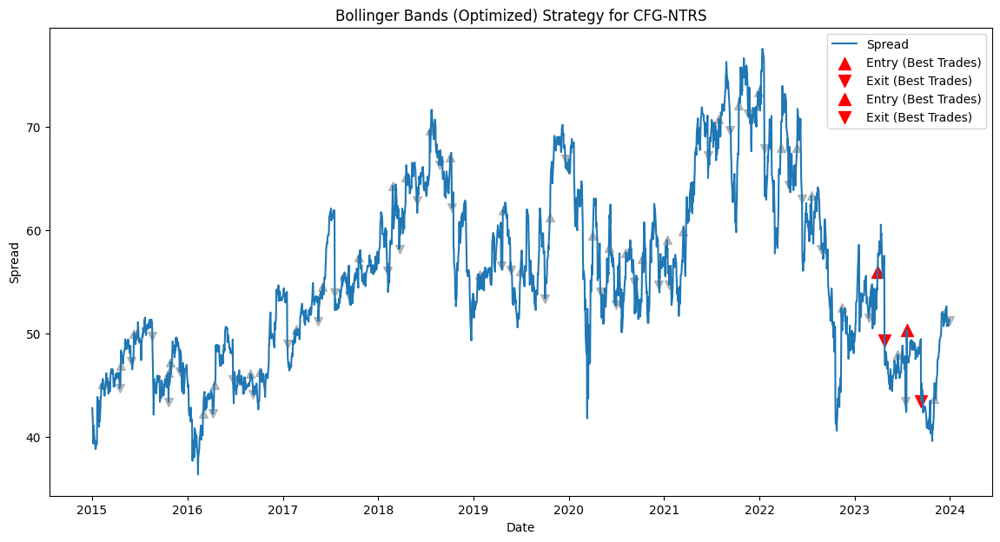


Trade Statistics for CFG-NTRS using Bollinger Bands (Optimized):
Total Trades: 38
Profitable Trades: 29
Losing Trades: 9
Win Rate: 76.32%
Average Trade Return: 2.99%
Average Winning Trade Return: 5.62%
Average Losing Trade Return: -5.51%

Optimized Strategy Performance:
Pair                                           CFG-NTRS
Strategy                    Bollinger Bands (Optimized)
Total Return                                 577.222148
Sharpe Ratio                                   0.955198
Sortino Ratio                                  1.390736
Number of Trades                                   74.5
Win Rate (%)                                  76.315789
Average Trade Return (%)                       2.987929
dtype: object


In [ ]:
# Get the best parameters
best_params = hyperparameter_results_df.iloc[0]
print("\nBest Hyperparameters:")
print(best_params)

# Re-run the strategy with the best parameters
if best_strategy_name == 'Moving Average Crossover':
    best_short_window = best_params['short_window']
    best_long_window = best_params['long_window']
    signals, spread = moving_average_crossover_strategy_with_params(pair_data, stock1, stock2, best_short_window, best_long_window)
elif best_strategy_name == 'Bollinger Bands':
    best_window_size = best_params['window_size']
    best_num_std_dev = best_params['num_std_dev']
    signals, spread = bollinger_bands_strategy_with_params(pair_data, stock1, stock2, best_window_size, best_num_std_dev)

# Backtest with best parameters
print(f"\nBacktesting {best_strategy_name} strategy on {stock1}-{stock2} with optimized parameters...")
optimized_results = backtest_strategy(pair_data, stock1, stock2, signals, spread, f"{best_strategy_name} (Optimized)")

# Display optimized results
print("\nOptimized Strategy Performance:")
print(pd.Series(optimized_results))
